# Block C, Year 1: Deep Learning Template

Name: Filip Šarík

Number: 243537

Please, use this template implement and document your solutions to the Deep Learning tasks as described in the [DataLab Tasks](https://adsai.buas.nl/Year1/BlockC/DataLabTasks.html) page. If you have any questions, please, contact your mentor or the content responsible. 

## Important Notes:
- [ ] Please, rename the file to ```Deep-Learning-YOUR_NAME-STUDENT_NUMBER.ipynb```. 
- [ ] You are allowed to add as many Markdown/Python cells as you need. 
- [ ] You are required to provide textual explanations on all tasks. Please use the markdown cells to explain all your decisions while building your image classification model.
- [ ] If more iteration steps were performed while building your model, please add more iteration sections in the template.
- [ ] If certain Markdown/Python cells were not used, please remove them from the final version of your file. 
- [ ] You must replace the instructions in the template sections with your own content.
- [ ] Your work must be reproducible, meaning that we should be able to run your code in the template and get similar results to yours. Tip: use relative paths to load your data!
- [ ] Ensure that before you hand in the template, you press ```Restart & Run all```; we should be able to see the results of your code in the notebook (i.e., output cells).
- [ ] Ensure that your code in the template is ```error-free```. In other words, we should not see any error messages when we run your code.

## Task 3.1: Create an Image Dataset

For my dataset, I will try to predict three classes: Resistor, Capacitor and Transistor

## A: Dataset Creation

### Finding the Right Datasets  
I started by searching for available datasets on **Kaggle**. After some exploration, I found several datasets that contained images of electronic components. Since my goal is to classify three main types of components—**resistors, capacitors, and transistors**—I focused on merging datasets that included these categories.  

Some datasets contained all three classes, while others had only one or two. To build a more **comprehensive baseline dataset**, I combined multiple sources:  

### Datasets Used:  
- [**Elec Dataset**](https://www.kaggle.com/datasets/olavomendes/elec-dataset)  
- [**Electronic Components Dataset**](https://www.kaggle.com/datasets/aryaminus/electronic-components)  
- [**Basic Electronic Components Dataset**](https://www.kaggle.com/datasets/julioazancort/basic-electronic-components)  
- [**Resistor Dataset**](https://www.kaggle.com/datasets/eralpozcan/resistor-dataset?resource=download)  

### Web Scraping for Additional Images  
In addition to these datasets, I **web scraped images from Google** to create a **validation set**. I made sure to select images that closely resemble **real-life photos** users would take when identifying components. This helps ensure the model generalizes well to practical use cases.  


## B: Dataset Cleaning

### Dataset Cleaning Process  

For cleaning my dataset, I performed **two main preprocessing steps**:  

1. **Resizing Images** – Each image was resized to **256x128 pixels** to ensure uniform dimensions.  
2. **Removing Duplicate Images** – Images with the **same hash** were identified and deleted to eliminate duplicates.  

Additionally, I manually reviewed the images to **remove low-quality or irrelevant samples**.  

---

### Image Resizing  
The following script resizes all images in the specified folder to **256x128 pixels** and replaces the original files with the resized versions.  


In [1]:
from PIL import Image
import os

path = r"C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor"

def resize():
    for item in os.listdir(path):
        file_path = os.path.join(path, item)
        if os.path.isfile(file_path):
            try:
                im = Image.open(file_path)
                f, e = os.path.splitext(file_path)
                im_resized = im.resize((256, 128))
                new_file_path = f + '_resized.jpg'
                im_resized.save(new_file_path, 'JPEG', quality=90)
                print(f"Resized and saved: {new_file_path}")

                # Remove the original file
                os.remove(file_path)
                print(f"Deleted original: {file_path}")

            except Exception as e:
                print(f"Error processing {file_path}: {e}")

resize()


Resized and saved: C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor\junction-transistor001_resized_resized_resized.jpg
Deleted original: C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor\junction-transistor001_resized_resized.jpg
Resized and saved: C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor\junction-transistor002_resized_resized_resized.jpg
Deleted original: C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor\junction-transistor002_resized_resized.jpg
Resized and saved: C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor\junction-transistor003_resized_resized_resized.jpg
Deleted original: C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor\junction-transistor003_resized_resized.jpg
Resized

### Removing Duplicate Images  

To prevent duplicate images from affecting the model's performance, I implemented a **hash-based deduplication process** using **SHA-1 hashing**.  

### Process Overview:  
- **Each image's hash is computed** using the **SHA-1 algorithm**.  
- **A set is used to track unique hashes**—if an image’s hash is already in the set, the duplicate file is deleted.  
- This method ensures that **identical images are removed**, regardless of their filenames.  

By removing duplicates, I reduce redundancy in the dataset, which helps improve model training efficiency and prevents **overfitting** to duplicate samples.  

In [2]:
import hashlib
import os

directory = r"C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Resistor"
hashes = set()

for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    digest = hashlib.sha1(open(path,'rb').read()).digest()
    if digest not in hashes:
        hashes.add(digest)
    else:
        os.remove(path)

In [3]:
import hashlib
import os

directory = r"C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Capacitor"
hashes = set()

for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    digest = hashlib.sha1(open(path,'rb').read()).digest()
    if digest not in hashes:
        hashes.add(digest)
    else:
        os.remove(path)

In [5]:
import hashlib
import os

directory = r"C:\Users\filip\Documents\GitHub\2024-25c-fai1-adsai-0FilipSarik243537\Dataset\All_in_one\Transistor"
hashes = set()

for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    digest = hashlib.sha1(open(path,'rb').read()).digest()
    if digest not in hashes:
        hashes.add(digest)
    else:
        os.remove(path)

## Making the Dataset  

I initially created a dataset with only **150 images per class** to test how well the model could perform with a **limited amount of data**.  

### Organizing and Labeling the Data  

To properly load and label images:  
- The **order of file paths must match** the order of **electronic components** in the `class_names` list.  
- This ensures that each image is assigned the **correct label**.  

### Dynamic Resizing  

At first, I resized and saved images manually. However, I later realized that **resizing can be done dynamically during processing**, making the dataset creation more efficient. To achieve this:  
- I defined a **target size** of `(256, 256)`, which is applied to all images before training.  

### Converting Data for Processing  

To work with the dataset in **machine learning models**, I:  
- **Stored images (`X`) and labels (`y`) in lists**.  
- **Shuffled the dataset** to prevent order bias.  
- **Converted `X` and `y` into NumPy arrays** for easier processing.  

By structuring the dataset this way, I ensured it was **clean, labeled correctly, and ready for model training**. 🚀  


In [15]:
import os
import numpy as np
import skimage as ski
from sklearn.utils import shuffle

# Folder paths where the images of each class are stored
folder_paths = [
    r"Dataset\All_in_one\Transistor",
    r"Dataset\All_in_one\Resistor",
    r"Dataset\All_in_one\Capacitor"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Transistor", 
    "Resistor",
    "Capacitor"
]

# Target size to resize the images
target_size = (256, 256)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                if len(class_images) == 150:
                    break
    # Add the sampled images and their labels to the main arrays
    X.extend(class_images)
    y.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X, y = shuffle(X, y, random_state=42)

# Convert arrays into numpy arrays
X = np.array(X)
y = np.array(y)


### Label encoding
- 0 - Transistor
- 1 - Resistor
- 2 - Capacitor

In [16]:
from sklearn.preprocessing import LabelEncoder

# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print("Encoded labels:", np.unique(y))  # Should be numbers like [0,1,2]


Encoded labels: [0 1 2]


## C: Final Dataset

Image dataset: [BUas SharePoint](https://edubuas-my.sharepoint.com/:f:/g/personal/243537_buas_nl/EjNh7yzIkKhDjgH0aTqTjHMBb_vmrFuGeX_FZlYB0O53Rg?e=gEyOY6)

## D: Load and Split

### Dataset Splitting

To train and evaluate my model, I needed to **split the dataset** into two parts:  
- **Training Set**: Used to train the model.  
- **Test Set**: Used to evaluate the model's performance after training.  

I used a **standard method** for this: splitting the dataset using a known function to ensure a fair evaluation of the model.

In [17]:
# Add your code to split the image dataset into training, validation, and test sets.
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 1/10,
                                                    random_state = 0)
                                                    
print(X_train.shape, X_test.shape)

(405, 256, 256, 3) (45, 256, 256, 3)


## Task 3.2: Calculate Baselines

### A: Random Guess Accuracy

In [65]:
len(y)

450

In [ ]:
val, counts = np.unique(y, return_counts=True)
print(val, counts)

[0 1 2] [150 150 150]


In [ ]:
label_encoder.inverse_transform([0, 1, 2])

array(['Capacitor', 'Resistor', 'Transistor'], dtype='<U10')

In [ ]:
for x in counts:
    print(x / len(y))

0.3333333333333333
0.3333333333333333
0.3333333333333333


#### Balancing the Dataset  

To ensure fairness and avoid class imbalance issues, I **balanced the dataset** by ensuring that each class—**Resistor**, **Capacitor**, and **Transistor**—has exactly **150 samples**.  

This ensures that the model trains on an equal number of samples from each class, avoiding bias toward any particular class.

#### Random Guess Accuracy  
Given that there are **three classes** in the dataset, the **random guess accuracy** would be:  
- **100% / 3 = 33.33%**  

This serves as a baseline for evaluating the performance of the model. If the model performs below this threshold, it suggests that it's not learning the patterns effectively.


### B: Basic Multilayer Perceptron Accuracy

#### I: Preprocessing

##### Preprocessing for the MLP Model  

As commonly stated in **MLP (Multi-Layer Perceptron)** studies, it's important to **normalize the data** to improve the model's performance. This ensures that all input features are on a similar scale, which helps the model learn more effectively.  

##### Normalization  
For my dataset, I **normalized the pixel values** by dividing them by **255** (the maximum pixel value for an image), which scales the values to a range between 0 and 1. This is a standard technique for image data.

In [18]:
# Add your code to preprocess your dataset for the basic MLP model.

# Normalize the pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# Flatten the images
X_train_flattened = X_train.reshape(X_train.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)

#### II: MLP Architecture 

##### MLP Architecture for Image Classification  

For the **Multi-Layer Perceptron (MLP)** architecture, I chose the **Sequential model** as it is straightforward to implement and is commonly recommended for beginners.  

##### Architecture Overview  

1. **Input Layer**:  
   The input layer is defined with the **shape** determined by the manually flattened **X_train**. This layer accepts the image data that has been preprocessed (normalized and flattened).  

2. **Hidden Layers**:  
   I added **3 dense layers** with the following configurations:
   - **First Dense Layer**: 128 neurons, using **ReLU** (Rectified Linear Unit) activation function.  
   - **Second Dense Layer**: 64 neurons, also using **ReLU** activation.  
   - **Third Dense Layer**: 3 neurons, using **Softmax** activation, as I am dealing with a **multiclass classification** problem. Softmax outputs probabilities for each of the three classes (Resistor, Capacitor, Transistor).  

3. **Output Layer**:  
   The final layer has **3 units** (one for each class) and uses the **Softmax** activation to predict the class probabilities.

##### Compiling the Model  

For compiling the model:
- I used the **Adam optimizer**, which is popular for its robustness and efficiency in training.  
- For the **loss function**, I used **Sparse Categorical Crossentropy**, which works well for multiclass classification problems where the target labels are integers.  
- The **evaluation metric** used is **accuracy**, as it is the standard metric for classification tasks.  

In [19]:
import keras

model = keras.models.Sequential([
    keras.layers.Input(shape=X_train_flattened.shape[1]),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
])

model.compile(optimizer='adam' , loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#### III: MLP Training

To train the **MLP model**, I used the following parameters and techniques to ensure effective training and avoid overfitting:

##### Training Parameters

- **Epochs**: I set the model to train for **50 epochs**. This allows enough time for the model to learn from the data.
- **Validation Split**: I used a **20% validation split**, meaning 20% of the training data is reserved for validation during each epoch to monitor the model's performance on unseen data.
- **EarlyStopping**: To avoid overfitting, I incorporated **EarlyStopping**. This callback monitors the validation loss and halts training if the model's performance doesn't improve after **5 epochs** (patience=5).

In [31]:
# Add your code to train the MLP model using early stopping and different learning rates.

model.fit(X_train_flattened, y_train, epochs=50, validation_split=0.2, callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/50
11/11 [==============================] - 3s 197ms/step - loss: 1.1698 - accuracy: 0.3488 - val_loss: 1.1112 - val_accuracy: 0.3086
Epoch 2/50
11/11 [==============================] - 2s 178ms/step - loss: 1.1111 - accuracy: 0.3580 - val_loss: 1.1483 - val_accuracy: 0.3704
Epoch 3/50
11/11 [==============================] - 2s 178ms/step - loss: 1.0590 - accuracy: 0.3765 - val_loss: 1.0012 - val_accuracy: 0.4444
Epoch 4/50
11/11 [==============================] - 2s 183ms/step - loss: 1.0311 - accuracy: 0.4568 - val_loss: 0.9956 - val_accuracy: 0.5062
Epoch 5/50
11/11 [==============================] - 2s 175ms/step - loss: 1.0023 - accuracy: 0.5463 - val_loss: 0.9874 - val_accuracy: 0.4198
Epoch 6/50
11/11 [==============================] - 2s 178ms/step - loss: 1.0035 - accuracy: 0.4969 - val_loss: 1.0150 - val_accuracy: 0.5926
Epoch 7/50
11/11 [==============================] - 2s 179ms/step - loss: 0.9804 - accuracy: 0.5154 - val_loss: 0.9750 - val_accuracy: 0.4321
Epoch 

#### IV: MLP Evaluation

After training the model, I evaluated its performance by looking at the accuracy graphs. The best **training accuracy** I achieved was around **70%**, but the **validation accuracy** was only around **50%**.  

At some point, the model's performance began to decline, which triggered **EarlyStopping** to halt the training after **5 epochs** without improvement.  

##### Analysis  
Considering the following factors:
- The dataset consists of only **450 samples** (150 per class), which is quite small for training a deep learning model.
- The architecture used was relatively **basic** with only three dense layers.

I believe the results are not too bad, given these limitations. A more complex model, larger dataset, or more advanced training techniques might improve performance.  

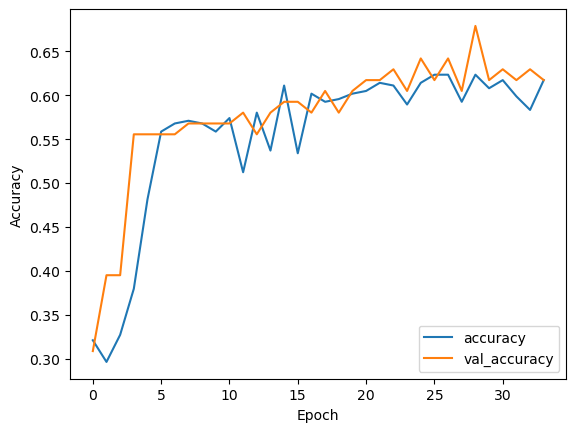

In [ ]:
# Add your code to evaluate the MLP model using appropriate metrics and learning curves.
import matplotlib.pyplot as plt
plt.plot(model.history.history['accuracy'], label='accuracy')
plt.plot(model.history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

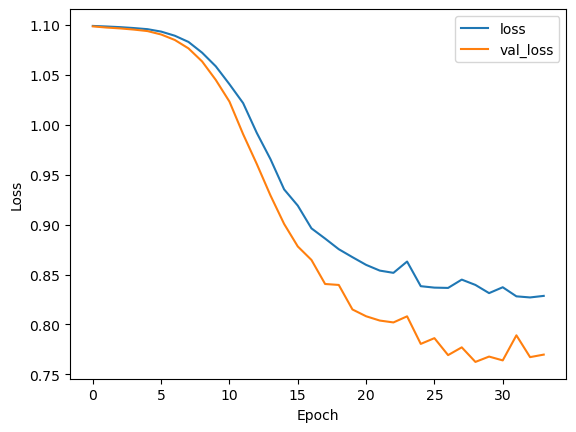

In [ ]:
plt.plot(model.history.history['loss'], label='loss')
plt.plot(model.history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

### Using different learning rates and checking the accuracy

To further improve the model, I decided to experiment with **hyperparameter tuning** by testing **four different learning rates** to see how they affect the model's performance.  

##### Experiment Details  
I trained the model with four different learning rates, adjusting the optimizer's behavior to observe how the rate affects the training process and final accuracy. The idea was to determine which learning rate would lead to the best model performance, balancing training speed and convergence.

In [69]:
learning_rates = [0.0001, 0.001, 0.01, 0.1]
histories = []

for lr in learning_rates:
    optimizer = keras.optimizers.Adam(learning_rate=lr)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train_flattened, y_train, epochs=50, validation_split=0.2, callbacks=[keras.callbacks.EarlyStopping(patience=5)])
    histories.append(history)

Epoch 1/50
11/11 [==============================] - 3s 200ms/step - loss: 0.5703 - accuracy: 0.7747 - val_loss: 0.9283 - val_accuracy: 0.5185
Epoch 2/50
11/11 [==============================] - 2s 172ms/step - loss: 0.5517 - accuracy: 0.8148 - val_loss: 0.9336 - val_accuracy: 0.5185
Epoch 3/50
11/11 [==============================] - 2s 168ms/step - loss: 0.5356 - accuracy: 0.8333 - val_loss: 0.9557 - val_accuracy: 0.5432
Epoch 4/50
11/11 [==============================] - 2s 169ms/step - loss: 0.5320 - accuracy: 0.8364 - val_loss: 0.9425 - val_accuracy: 0.5432
Epoch 5/50
11/11 [==============================] - 2s 167ms/step - loss: 0.5347 - accuracy: 0.8148 - val_loss: 0.9357 - val_accuracy: 0.5309
Epoch 6/50
11/11 [==============================] - 2s 169ms/step - loss: 0.5223 - accuracy: 0.8302 - val_loss: 0.9495 - val_accuracy: 0.5309
Epoch 1/50
11/11 [==============================] - 3s 183ms/step - loss: 0.6740 - accuracy: 0.7160 - val_loss: 1.1929 - val_accuracy: 0.3951
Epoch 

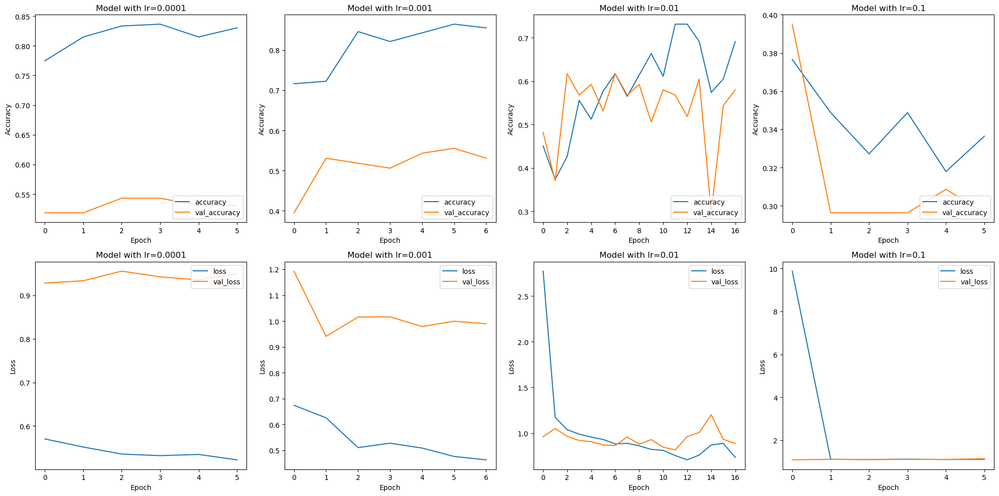

In [70]:
import matplotlib.pyplot as plt

# Create a figure with 2 main plots, each containing 4 subplots
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Plot accuracy and validation accuracy for each learning rate in the first main plot
for i, history in enumerate(histories):
    axes[0, i].plot(history.history['accuracy'], label='accuracy')
    axes[0, i].plot(history.history['val_accuracy'], label='val_accuracy')
    axes[0, i].set_title(f'Model with lr={learning_rates[i]}')
    axes[0, i].set_xlabel('Epoch')
    axes[0, i].set_ylabel('Accuracy')
    axes[0, i].legend(loc='lower right')

# Plot loss and validation loss for each learning rate in the second main plot
for i, history in enumerate(histories):
    axes[1, i].plot(history.history['loss'], label='loss')
    axes[1, i].plot(history.history['val_loss'], label='val_loss')
    axes[1, i].set_title(f'Model with lr={learning_rates[i]}')
    axes[1, i].set_xlabel('Epoch')
    axes[1, i].set_ylabel('Loss')
    axes[1, i].legend(loc='upper right')

plt.tight_layout()
plt.show()

### C: Human-Level Performance Accuracy

I created a **quiz using Microsoft Forms** to classify the electrical parts into three classes: **Resistor**, **Transistor**, and **Capacitor**. The quiz contained **18 questions** with images, with **6 questions per class**.  

I collected responses from **7 participants**, meaning I received **42 responses per class** (7 participants * 6 questions per class). The average score across all participants was **10 out of 18** (approximately **55% accuracy**).

##### Participant Results

**First Respondent:**  
- **Total score**: 6/18  
- **Capacitors**: 1/6 = 17%  
- **Transistors**: 0/6 = 0%  
- **Resistors**: 5/6 = 83%  

**Second Respondent:**  
- **Total score**: 15/18  
- **Capacitors**: 4/6 = 67%  
- **Transistors**: 6/6 = 100%  
- **Resistors**: 5/6 = 83%  

**Third Respondent:**  
- **Total score**: 6/18  
- **Capacitors**: 3/6 = 50%  
- **Transistors**: 2/6 = 33%  
- **Resistors**: 1/6 = 17%  

**Fourth Respondent:**  
- **Total score**: 13/18  
- **Capacitors**: 4/6 = 67%  
- **Transistors**: 4/6 = 67%  
- **Resistors**: 5/6 = 83%  

**Fifth Respondent:**  
- **Total score**: 13/18  
- **Capacitors**: 5/6 = 83%  
- **Transistors**: 4/6 = 67%  
- **Resistors**: 4/6 = 67%  

**Sixth Respondent:**  
- **Total score**: 12/18  
- **Capacitors**: 4/6 = 67%  
- **Transistors**: 3/6 = 50%  
- **Resistors**: 5/6 = 83%  

**Seventh Respondent:**  
- **Total score**: 6/18  
- **Capacitors**: 2/6 = 33%  
- **Transistors**: 3/6 = 50%  
- **Resistors**: 1/6 = 17%  

##### Insights and Analysis  
- **Best Performer**: The second respondent achieved **15/18**, with perfect accuracy on **Transistors**.  
- **Worst Performer**: The first and seventh respondents had the lowest scores, mainly struggling with **Transistors**.  
- The overall **human accuracy** averaged around **55%**, which provides insight into how challenging this classification task is for humans. This suggests that improving the dataset's quality or adding more varied images could help increase classification accuracy.


## Task 3.3: Basic Convolutional Neural Network (Iteration 1)

### A: Preprocessing

##### Increasing Dataset Size

Before running the first iteration of the Convolutional Neural Network (CNN), I realized that increasing the number of samples in the dataset would be beneficial for improving the model's performance. To achieve this, I used the same process from **Task 3.1 B**, but this time I increased the dataset to 1000 image samples. The images were resized dynamically using the target size, then converted to arrays and encoded.

This approach will allow the model to learn from a larger set of images, potentially improving its generalization ability and reducing overfitting.


In [5]:
import numpy as np
import os
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Desktop\Dataset_2\Capacitors",
    r"C:\Users\filip\Desktop\Dataset_2\Resistors",
    r"C:\Users\filip\Desktop\Dataset_2\Transistors"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitor", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (256, 256)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size, anti_aliasing=True)
                # Ensure the image has 3 channels
                if image_resized.shape[-1] != 3:
                    image_resized = np.stack((image_resized,) * 3, axis=-1)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                if len(class_images) == 1000:
                    break
    # Add the sampled images and their labels to the main arrays
    X.extend(class_images)
    y.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X, y = shuffle(X, y, random_state=0)

# Convert arrays into numpy arrays
X = np.array(X)
y = np.array(y)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print("Encoded labels:", np.unique(y))  # Should be numbers like [0,1,2]


X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 2/10,
                                                    random_state = 42)
                                                    
print(X_train.shape, X_test.shape)


Encoded labels: [0 1 2]
(2400, 256, 256, 3) (600, 256, 256, 3)


### B: CNN Architecture

By looking at some research papers, I found some inspiration for the architecture of my Convolutional Neural Network (CNN). The architecture mentioned the use of the SGD optimizer, which I decided to incorporate into my own model.

The architecture follows this general sequence:

- **Conv2D** → **MaxPooling2D** → **Conv2D** → **Conv2D** → **MaxPooling2D** → **Conv2D** → **MaxPooling2D** → **Conv2D** → **Conv2D** → **MaxPooling2D** → **Dense** → **Dense** → **Softmax**

##### Hyperparameters:
- **Optimizer**: SGD
- **Loss function**: Sparse Categorical Cross-Entropy

##### Architecture Breakdown:

1. **Conv2D (First Layer)**: 
   The first layer takes the image and applies a filter to detect patterns like edges or textures. Since I wasn't sure how the Convolution layer works at this point, I started small with only 8 filters.

2. **MaxPooling2D**: 
   After each Convolution layer, MaxPooling is applied to downsample the output, reducing the number of features.

3. **Additional Conv2D Layers**: 
   Two more Conv2D layers are added to find more complex details in the image. I increased the number of filters to 16 in one of these layers to capture finer details.

4. **Flatten Layer**: 
   After the convolution layers, the output is flattened so that it can be passed into the Dense layers.

5. **Dense Layers**: 
   The last two Dense layers have 128 and 3 units, respectively. This means I am connecting all 128 possible inputs to 3 outputs. While this may sound inefficient now, this is just the first iteration, and I plan to adjust it in future iterations.

##### Optimizer and Loss Function:
- **Optimizer**: SGD (Stochastic Gradient Descent)
- **Loss Function**: Sparse Categorical Cross-Entropy (as the problem is a multiclass classification task)

This architecture serves as a starting point, and I will refine it as I progress through the iterations.


In [6]:
from tensorflow import keras

model_1 = keras.Sequential([
    # Convolution-1
    keras.layers.Conv2D(8, (3, 3), strides=1, activation='relu', input_shape=(256, 256, 3), padding='valid'),
    # Pooling-1
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Convolution-2
    keras.layers.Conv2D(8, (5, 5), strides=1, activation='relu', padding='valid'),

    # Convolution-3
    keras.layers.Conv2D(16, (5, 5), strides=2, activation='relu', padding='valid'),

    # Pooling-2
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=1),

    # Convolution-4
    keras.layers.Conv2D(16, (9, 9), strides=1, activation='relu', padding='valid'),

    # Pooling-3
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Convolution-5
    keras.layers.Conv2D(32, (9, 9), strides=1, activation='relu', padding='valid'),

    # Convolution-6
    keras.layers.Conv2D(64, (9, 9), strides=1, activation='relu', padding='valid'),

    # Pooling-4
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Flatten for Dense layers
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
])

# Check summary
model_1.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 254, 254, 8)       224       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 127, 127, 8)       0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 123, 123, 8)       1608      
                                                                 
 conv2d_8 (Conv2D)           (None, 60, 60, 16)        3216      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 59, 59, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 51, 51, 16)       

### C: CNN Training

I decided to use the **SGD** optimizer for training the CNN model after reading some research papers that recommended it. While it takes longer to train compared to **Adam**, I will stick with **SGD** for now and monitor the results.

In [18]:
# Add your code to train the CNN model using proper loss functions, optimizers, and hyperparameters.
model_1.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model_1.fit(X_train, y_train, epochs=40, validation_split=0.20, callbacks=[keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True), keras.callbacks.History()])

Epoch 1/40
60/60 [==============================] - 8s 119ms/step - loss: 0.3272 - accuracy: 0.8625 - val_loss: 0.4095 - val_accuracy: 0.8188
Epoch 2/40
60/60 [==============================] - 6s 93ms/step - loss: 0.2893 - accuracy: 0.8760 - val_loss: 0.5856 - val_accuracy: 0.7667
Epoch 3/40
60/60 [==============================] - 5s 90ms/step - loss: 0.3189 - accuracy: 0.8708 - val_loss: 0.4975 - val_accuracy: 0.7875
Epoch 4/40
60/60 [==============================] - 5s 90ms/step - loss: 0.2722 - accuracy: 0.8901 - val_loss: 0.5017 - val_accuracy: 0.7708
Epoch 5/40
60/60 [==============================] - 5s 90ms/step - loss: 0.2671 - accuracy: 0.8875 - val_loss: 0.4748 - val_accuracy: 0.7833
Epoch 6/40
60/60 [==============================] - 6s 97ms/step - loss: 0.2619 - accuracy: 0.8979 - val_loss: 0.5532 - val_accuracy: 0.7667


### D: Model Evaluation

After training the CNN model for 40 epochs, the evaluation on the test set gave an **86% accuracy**. 

##### Observations:
- **Loss Trend**: The loss showed a steady decrease during the initial epochs. However, around **epoch 10**, the model began to **overfit** slightly. This was evident in the drop of accuracy in the subsequent epochs, which can be seen in the training graph.
- **Early Stopping**: The early stopping mechanism with a patience of 5 epochs allowed the training to continue a bit longer even after the signs of overfitting started to show.

##### Confusion Matrix Analysis:
Upon reviewing the confusion matrix, I noticed that the model had the biggest issue with **misclassifying Transistors as Capacitors**. This misclassification pattern persisted throughout the training process and would remain a challenge as the project progresses.

Despite the overfitting and misclassification, the model achieved a decent performance with an **86% accuracy**, which I will use as a baseline for further improvements.


In [34]:
model_1.evaluate(X_test, y_test)

19/19 [==============================] - 1s 35ms/step - loss: 0.3369 - accuracy: 0.8650


[0.3369160592556, 0.8650000095367432]

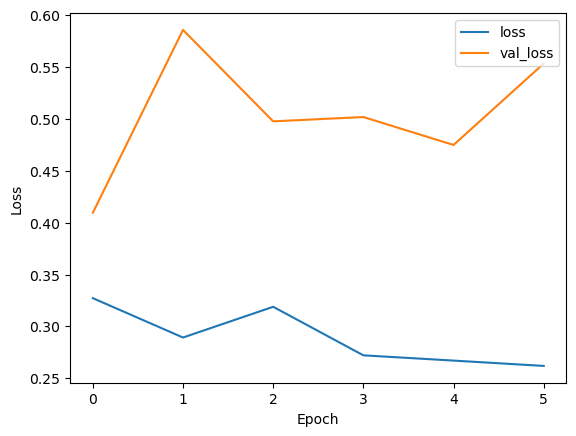

In [23]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

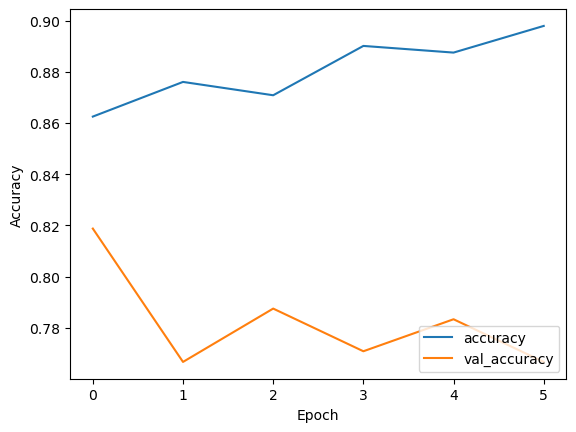

In [24]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

19/19 [==============================] - 1s 31ms/step


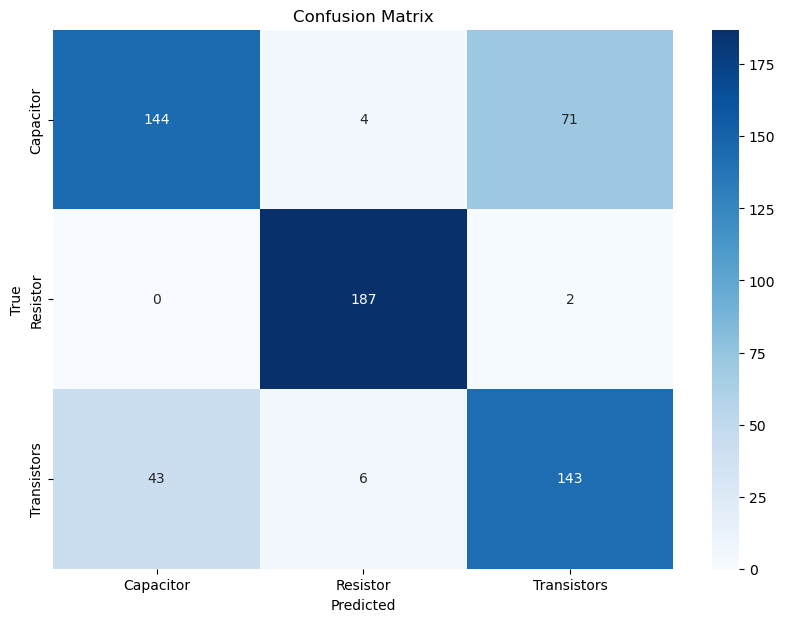

In [25]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_1.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Task 3.4: Data Augmentation (Iteration 2)

### A: Preprocessing

Before moving to the second iteration, I found additional datasets that I combined to increase the size of my classes. At this point, I wasn't aware that I could dynamically resize the images, so I started by removing duplicates based on image hashes. After removing duplicates, I documented the changes for two classes:

- **Resistors**:  
  - Before removing duplicates: 7911 samples  
  - After removing duplicates: 7872 samples

- **Transistors**:  
  - Before removing duplicates: 6081 samples  
  - After removing duplicates: 3052 samples

After removing duplicates, I manually resized the images. Later, I reused the same code to load the images and their labels, but this time I implemented dynamic resizing for the images.


In [ ]:
import hashlib
import os

directory = r"C:\Users\filip\Desktop\Dataset_2\Capacitors"
hashes = set()

for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    digest = hashlib.sha1(open(path,'rb').read()).digest()
    if digest not in hashes:
        hashes.add(digest)
    else:
        os.remove(path)

Resistors before removing : 7911

After: 7872

In [ ]:
import hashlib
import os

directory = r"C:\Users\filip\Desktop\Dataset_2\Resistors"
hashes = set()

for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    digest = hashlib.sha1(open(path,'rb').read()).digest()
    if digest not in hashes:
        hashes.add(digest)
    else:
        os.remove(path)

Transistors before : 6081

After : 3052

In [ ]:
import hashlib
import os

directory = r"C:\Users\filip\Desktop\Dataset_2\Transistors"
hashes = set()

for filename in os.listdir(directory):
    path = os.path.join(directory, filename)
    digest = hashlib.sha1(open(path,'rb').read()).digest()
    if digest not in hashes:
        hashes.add(digest)
    else:
        os.remove(path)

In [ ]:
from PIL import Image
import os

def resize_images_in_folder(directory, target_size=(256, 256)):
    """
    Resizes all images in the specified folder to the target size.

    Parameters:
        directory (str): Path to the folder containing images.
        target_size (tuple): Desired size for the images (width, height).

    Returns:
        None
    """
    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)
        if os.path.isfile(file_path):
            try:
                with Image.open(file_path) as img:
                    img_resized = img.resize(target_size)
                    img_resized.save(file_path)
                    print(f"Resized: {file_path}")
            except Exception as e:
                print(f"Error resizing {file_path}: {e}")

In [ ]:
resize_images_in_folder(r"C:\Users\filip\Desktop\Dataset_2\Capacitors")
resize_images_in_folder(r"C:\Users\filip\Desktop\Dataset_2\Resistors")
resize_images_in_folder(r"C:\Users\filip\Desktop\Dataset_2\Transistors")

Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor001.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor002.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor003.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor004.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor005.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor006.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor007.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor008.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor009.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor010.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor011.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor012.jpg
Resized: C:\Users\filip\Desktop\Dataset_2\Capacitors\Bypass-capacitor013.jpg

In [26]:
import numpy as np
import os
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Desktop\Dataset_2\Capacitors",
    r"C:\Users\filip\Desktop\Dataset_2\Resistors",
    r"C:\Users\filip\Desktop\Dataset_2\Transistors"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitor", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (256, 256)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size, anti_aliasing=True)
                # Ensure the image has 3 channels
                if image_resized.shape[-1] != 3:
                    image_resized = np.stack((image_resized,) * 3, axis=-1)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                if len(class_images) == 1000:
                    break
    # Add the sampled images and their labels to the main arrays
    X.extend(class_images)
    y.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X, y = shuffle(X, y, random_state=0)

# Convert arrays into numpy arrays
X = np.array(X)
y = np.array(y)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print("Encoded labels:", np.unique(y))  # Should be numbers like [0,1,2]


X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 2/10,
                                                    random_state = 42, stratify=y)
                                                    
print(X_train.shape, X_test.shape)


Encoded labels: [0 1 2]
(2400, 256, 256, 3) (600, 256, 256, 3)


### B: CNN Architecture

For **Iteration 2**, I kept the architecture the same as in **Iteration 1**, as I wanted to evaluate whether the results would improve with the addition of the data augmentation layer. The data augmentation applied includes:

- Random rotation
- Zoom
- Width shift
- Height shift
- Contrast adjustment

In [31]:
from tensorflow import keras

model_2 = keras.Sequential([
    keras.layers.Input(shape=(256, 256, 3)),
    keras.layers.RandomRotation(0.2),
    keras.layers.RandomZoom(0.2),
    keras.layers.RandomWidth(0.2),
    keras.layers.RandomHeight(0.2),
    keras.layers.RandomContrast(0.2),

    keras.layers.Conv2D(8, (3, 3), strides=1, activation='relu', padding='valid'),
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    keras.layers.Conv2D(8, (5, 5), strides=1, activation='relu', padding='valid'),
    keras.layers.Conv2D(16, (5, 5), strides=2, activation='relu', padding='valid'),
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=1),

    keras.layers.Conv2D(16, (9, 9), strides=1, activation='relu', padding='valid'),
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    keras.layers.Conv2D(32, (9, 9), strides=1, activation='relu', padding='valid'),
    keras.layers.Conv2D(64, (9, 9), strides=1, activation='relu', padding='valid'),
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    keras.layers.GlobalAveragePooling2D(),  # Adaptive spatial reduction
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
])

model_2.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_rotation_3 (RandomR  (None, 256, 256, 3)       0         
 otation)                                                        
                                                                 
 random_zoom_3 (RandomZoom)  (None, 256, 256, 3)       0         
                                                                 
 random_width_3 (RandomWidt  (None, 256, None, 3)      0         
 h)                                                              
                                                                 
 random_height_3 (RandomHei  (None, None, None, 3)     0         
 ght)                                                            
                                                                 
 random_contrast_3 (RandomC  (None, None, None, 3)     0         
 ontrast)                                             

### C: CNN Training

For **Iteration 2**, I kept the training process the same to evaluate if the results would improve with the added data augmentation layer. However, I increased the number of epochs to 80 and started using `restore_best_weights` to ensure that the model retains the best weights after early stopping.

In [32]:
# Add your code to train the CNN model using proper loss functions, optimizers, and hyperparameters.,
model_2.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model_2.fit(X_train, y_train, epochs=80, validation_split=0.20, callbacks=[keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True), keras.callbacks.History()])

Epoch 1/80
60/60 [==============================] - 15s 217ms/step - loss: 1.0980 - accuracy: 0.3521 - val_loss: 1.0975 - val_accuracy: 0.2896
Epoch 2/80
60/60 [==============================] - 11s 182ms/step - loss: 1.0952 - accuracy: 0.3526 - val_loss: 1.0939 - val_accuracy: 0.3333
Epoch 3/80
60/60 [==============================] - 11s 182ms/step - loss: 1.0899 - accuracy: 0.3490 - val_loss: 1.0861 - val_accuracy: 0.3167
Epoch 4/80
60/60 [==============================] - 11s 184ms/step - loss: 1.0751 - accuracy: 0.3943 - val_loss: 1.0706 - val_accuracy: 0.4854
Epoch 5/80
60/60 [==============================] - 11s 181ms/step - loss: 1.0264 - accuracy: 0.4510 - val_loss: 0.9540 - val_accuracy: 0.5625
Epoch 6/80
60/60 [==============================] - 11s 184ms/step - loss: 0.9466 - accuracy: 0.5167 - val_loss: 0.8912 - val_accuracy: 0.5604
Epoch 7/80
60/60 [==============================] - 11s 185ms/step - loss: 0.9034 - accuracy: 0.5568 - val_loss: 0.8586 - val_accuracy: 0.6229

### D: Model Evaluation

When comparing the results from **Iteration 2** with those of **Iteration 1** on the **X_test** dataset, I noticed a decrease in accuracy. 

Another important metric I analyzed was the confusion matrix. While **Iteration 2** showed a reduction in the misclassification of **Capacitors**, it also led to an increased misclassification of **Transistors**. This suggests that, although data augmentation improved some aspects of the model, it also introduced some new challenges, particularly in the classification of **Transistors**.

In [33]:
# Add your code to evaluate the CNN model using appropriate metrics and learning curves.
model_2.evaluate(X_test, y_test)

19/19 [==============================] - 1s 39ms/step - loss: 0.4527 - accuracy: 0.7800


[0.45265844464302063, 0.7799999713897705]

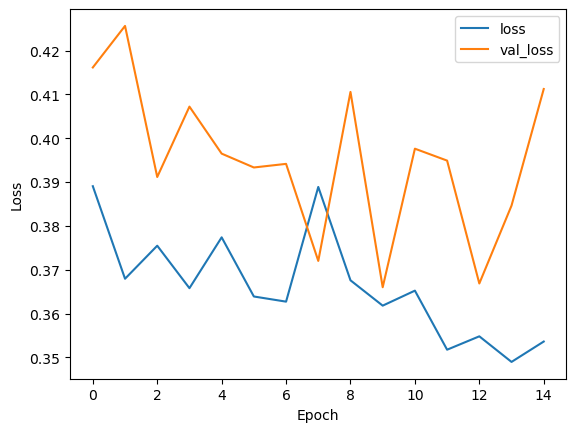

In [51]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

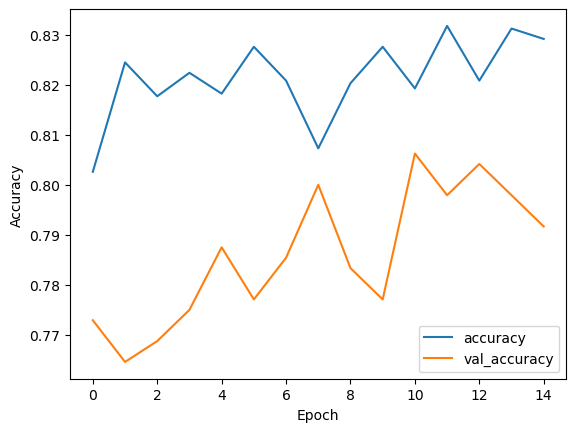

In [54]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

19/19 [==============================] - 1s 41ms/step


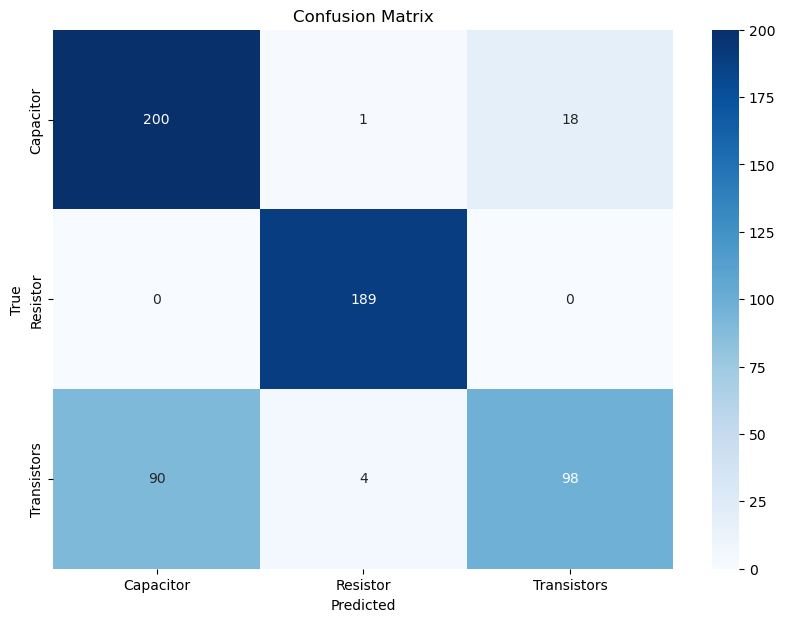

In [56]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_2.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Task 3.5: Transfer Learning (Iteration 3)

### A: Preprocessing

In the next iterations, I will only be using this as my preprocessing. 

This code preprocesses a dataset of images for use in a Convolutional Neural Network (CNN) model. Here's a breakdown of what the code does:

1. **Folder Paths and Class Names:**
   - Defines folder paths for images of each class (Capacitors, Resistors, and Transistors) and the corresponding class labels.

2. **Resize Images:**
   - Reads the images from the specified directories and resizes them to a target size of (256, 256). It ensures all images have 3 channels (RGB) and handles non-3D images by stacking them.

3. **Store Images and Labels:**
   - Stores the resized images in an array `X` and assigns the corresponding class labels in the array `y`.

4. **Shuffle and Split:**
   - Shuffles the dataset to ensure randomness and splits it into training and test sets using `train_test_split` from `sklearn`.

5. **Label Encoding:**
   - Encodes the class labels into numerical values (0, 1, 2) using `LabelEncoder`.

In [1]:
# Add your code to preprocess the dataset for the CNN model.
# Same as in Iretation 2
import numpy as np
import os
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Desktop\Dataset_2\Capacitors",
    r"C:\Users\filip\Desktop\Dataset_2\Resistors",
    r"C:\Users\filip\Desktop\Dataset_2\Transistors"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitor", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (256, 256)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size, anti_aliasing=True)
                # Ensure the image has 3 channels
                if image_resized.shape[-1] != 3:
                    image_resized = np.stack((image_resized,) * 3, axis=-1)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                if len(class_images) == 1000:
                    break
    # Add the sampled images and their labels to the main arrays
    X.extend(class_images)
    y.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X, y = shuffle(X, y, random_state=0)

# Convert arrays into numpy arrays
X = np.array(X)
y = np.array(y)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print("Encoded labels:", np.unique(y))  # Should be numbers like [0,1,2]


X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 2/10,
                                                    random_state = 42, stratify=y)
                                                    
print(X_train.shape, X_test.shape)

Encoded labels: [0 1 2]
(2400, 256, 256, 3) (600, 256, 256, 3)


### B: CNN Architecture

For my transfer learning experiment, I have chosen **MobileNet** as the base model. MobileNet is optimized for mobile devices, providing a good balance between speed and efficiency, making it an ideal choice for this task. Here's how I set up the model:

1. **MobileNet Model:**
   - Used **MobileNet** with pre-trained weights from **ImageNet**.
   - Set the input shape of the model to **256x256**, matching the size of the images in my dataset.
   - Disabled training for the base MobileNet model to prevent its weights from being updated during the training process (i.e., set `trainable=False`).

2. **Architecture:**
   - The architecture remained similar to the previous iterations, but this time I replaced the standard CNN layers with the transfer model (MobileNet). 
   - I omitted the data augmentation layer to focus on the effect of the transfer model.

In [2]:
# Add your code to create a CNN architecture for your image dataset.
from tensorflow import keras

base_model = keras.applications.MobileNet(
                include_top=False,
                weights='imagenet',
                input_shape=(256, 256, 3))

base_model.trainable = False

In [3]:
from tensorflow import keras

model_3 = keras.Sequential([
    
    base_model,
    # Convolution-1
    keras.layers.Conv2D(8, (3, 3), strides=1, activation='relu', input_shape=(256, 256, 3), padding='same'),
    # Pooling-1
    #keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Convolution-2
    keras.layers.Conv2D(8, (5, 5), strides=1, activation='relu', padding='same'),

    # Convolution-3
    keras.layers.Conv2D(16, (5, 5), strides=2, activation='relu', padding='same'),

    # Pooling-2
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Convolution-4
    keras.layers.Conv2D(16, (3, 3), strides=1, activation='relu', padding='same'),

    # Pooling-3
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Convolution-5
    keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same'),

    # Convolution-6
    keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same'),

    # Pooling-4
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=1, padding='same'),

    # Flatten for Dense layers
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
])

model_3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 8, 8, 1024)        3228864   
 onal)                                                           
                                                                 
 conv2d (Conv2D)             (None, 8, 8, 8)           73736     
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 8)           1608      
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 16)          3216      
                                                                 
 max_pooling2d (MaxPooling2  (None, 2, 2, 16)          0         
 D)                                                              
                                                                 
 conv2d_3 (Conv2D)           (None, 2, 2, 16)          2

### C: CNN Training

For training, I kept the process the same as previous iterations to assess if the inclusion of the pre-trained **MobileNet** model improves the results:

In [5]:
# Add your code to train the CNN model using proper loss functions, optimizers, and hyperparameters.
model_3.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model_3.fit(X_train, y_train, epochs=40, validation_split=0.20, callbacks=[keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True),keras.callbacks.History()])

Epoch 1/40
60/60 [==============================] - 28s 431ms/step - loss: 0.1244 - accuracy: 0.9505 - val_loss: 0.1828 - val_accuracy: 0.9396
Epoch 2/40
60/60 [==============================] - 24s 402ms/step - loss: 0.1080 - accuracy: 0.9573 - val_loss: 0.1748 - val_accuracy: 0.9375
Epoch 3/40
60/60 [==============================] - 24s 400ms/step - loss: 0.1124 - accuracy: 0.9620 - val_loss: 0.2765 - val_accuracy: 0.9229
Epoch 4/40
60/60 [==============================] - 24s 399ms/step - loss: 0.0903 - accuracy: 0.9703 - val_loss: 0.1958 - val_accuracy: 0.9312
Epoch 5/40
60/60 [==============================] - 25s 410ms/step - loss: 0.0782 - accuracy: 0.9688 - val_loss: 0.1699 - val_accuracy: 0.9292
Epoch 6/40
60/60 [==============================] - 24s 401ms/step - loss: 0.0524 - accuracy: 0.9823 - val_loss: 0.1832 - val_accuracy: 0.9292
Epoch 7/40
60/60 [==============================] - 24s 400ms/step - loss: 0.0646 - accuracy: 0.9792 - val_loss: 0.2548 - val_accuracy: 0.9333

### D: Model Evaluation

After training the model with **MobileNet** as the base for transfer learning, the evaluation shows:

1. **Accuracy:**
   - The model achieved **90% accuracy** on the test set, which is an improvement compared to the previous iteration.

2. **Confusion Matrix:**
   - The confusion matrix indicates improved classification across all classes.
   - Misclassifications have decreased significantly, though there is still slight room for improvement in distinguishing between **Transistors** and **Capacitors**.

3. **Holdout set:**
   - Use of holdout dataset as a accuracy metric

This shows that leveraging pre-trained models like MobileNet can boost performance, especially when the model is already trained on a vast dataset like ImageNet.

In [6]:
# Add your code to evaluate the CNN model using appropriate metrics and learning curves.
model_3.evaluate(X_test, y_test)

19/19 [==============================] - 6s 304ms/step - loss: 0.2582 - accuracy: 0.9067


[0.25819072127342224, 0.9066666960716248]

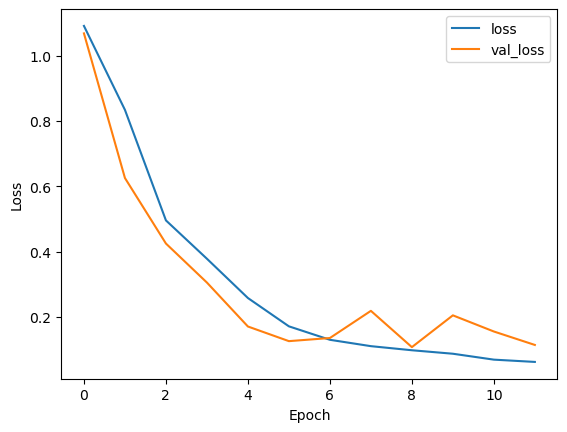

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

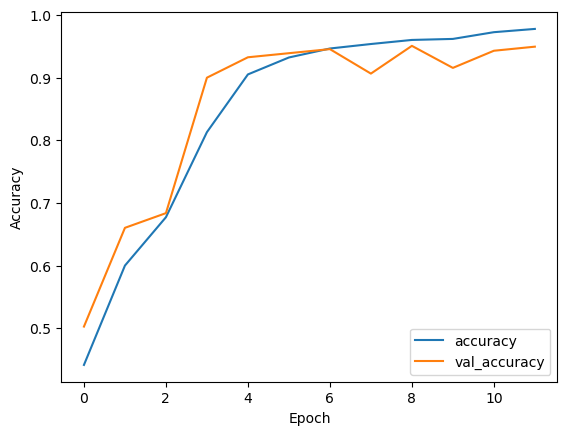

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

38/38 [==============================] - 15s 360ms/step


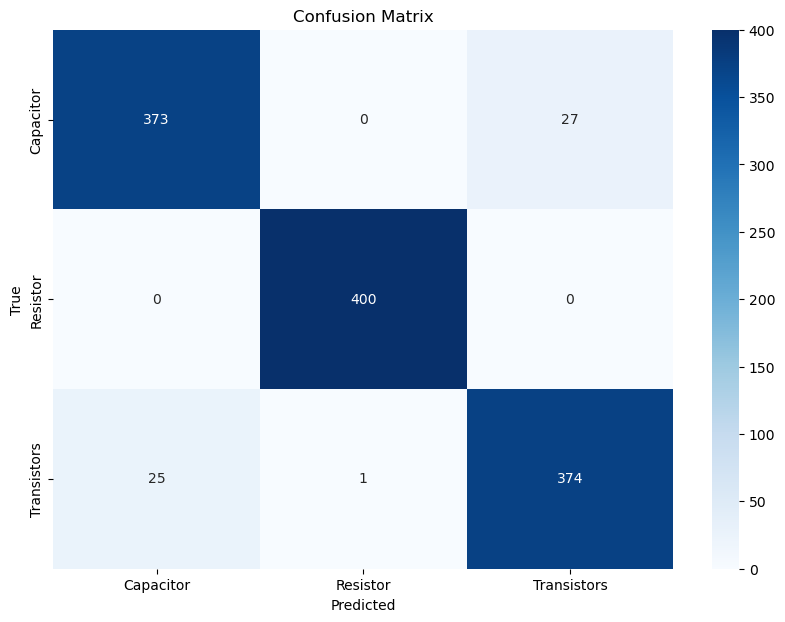

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_3.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

At this stage, I have decided to create a development set to see how the model does on unseen data

In [11]:
import os
import numpy as np
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Capacitor",
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Resistor",
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Transistor"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitors", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (256, 256)

# Arrays to store the images (X) and class labels (y)
X_validation = []
y_validation = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size)
                # Insert the image into class_images
                class_images.append(image_resized)
    # Add the sampled images and their labels to the main arrays
    X_validation.extend(class_images)
    y_validation.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X_validation, y_validation = shuffle(X_validation, y_validation, random_state=42)

# Convert arrays into numpy arrays
X_validation = np.array(X_validation)
y_validation = np.array(y_validation)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y_validation = label_encoder.fit_transform(y_validation)

print("Encoded labels:", np.unique(y_validation))  # Should be numbers like [0,1,2]
X_validation.shape

Encoded labels: [0 1 2]


(134, 256, 256, 3)

In [12]:
model_3.evaluate(X_validation, y_validation)

5/5 [==============================] - 1s 276ms/step - loss: 1.1807 - accuracy: 0.7388


[1.1807332038879395, 0.7388059496879578]

5/5 [==============================] - 2s 263ms/step


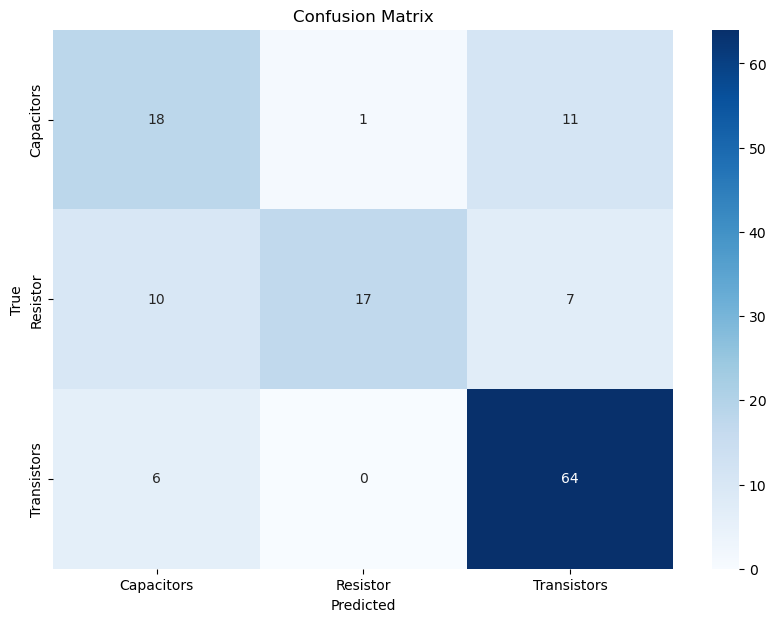

In [13]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_3.predict(X_validation)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_validation, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


By looking at the confusion martix of holdout set, I can see that the model is not doing quite so well. For now, I will try model centric approach, where in next iterations, I will try to improve the model without improving the dataset

## Task 3.6: Model Improvement (Iteration 4)

### A: Preprocessing

Explained in previous Iteration

In [ ]:
# Add your code to preprocess the dataset for the CNN model.
import numpy as np
import os
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Desktop\Dataset_2\Capacitors",
    r"C:\Users\filip\Desktop\Dataset_2\Resistors",
    r"C:\Users\filip\Desktop\Dataset_2\Transistors"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitor", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (256, 256)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size, anti_aliasing=True)
                # Ensure the image has 3 channels
                if image_resized.shape[-1] != 3:
                    image_resized = np.stack((image_resized,) * 3, axis=-1)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                if len(class_images) == 1000:
                    break
    # Add the sampled images and their labels to the main arrays
    X.extend(class_images)
    y.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X, y = shuffle(X, y, random_state=0)

# Convert arrays into numpy arrays
X = np.array(X)
y = np.array(y)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print("Encoded labels:", np.unique(y))  # Should be numbers like [0,1,2]


X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 2/10,
                                                    random_state = 42, stratify=y)
                                                    
print(X_train.shape, X_test.shape)


### B: CNN Architecture

In this iteration, the architecture of the CNN model combines a pre-trained **MobileNet** model with additional convolutional and pooling layers for feature extraction. The strategy aims to take advantage of the transfer learning capability while further refining the model with custom layers.

1. **Base Model (MobileNet):**
   - The model starts with **MobileNet**, which is pre-trained on **ImageNet**. MobileNet is used as a feature extractor by setting `include_top=False` and freezing its weights (`base_model.trainable = False`).
   - The input shape is set to **256x256x3**, which matches the resized image size.
   - This allows the model to benefit from the extensive feature learning MobileNet has already done, without training the base model again.

2. **Additional Convolutional Layers:**
   - **Convolutional layers (Conv2D)**: Several convolutional layers are added to extract more intricate patterns from the images:
     - Layers with 16, 8, and 32 filters of size 3x3 and 5x5.
     - The ReLU activation function is used to introduce non-linearity and help the model learn complex patterns.
   - **MaxPooling layers (MaxPooling2D)**: Pooling layers help reduce spatial dimensions, making the model more efficient by downsampling the feature maps. This helps retain important features while reducing computational complexity.

3. **Flattening and Fully Connected Layers:**
   - The output from the convolutional and pooling layers is flattened into a 1D vector using the `Flatten()` layer, which is suitable for the fully connected layers.
   - The **Dense** layers are used to perform classification:
     - A hidden layer with 128 units and ReLU activation.
     - The final output layer has 3 units (one for each class) with **softmax activation** to output class probabilities.

This model architecture is designed to leverage the pre-trained MobileNet as a feature extractor, while further learning custom features through additional convolutional and pooling layers. The approach should help improve the model's performance by utilizing both the generalizable features of MobileNet and more specific features from the dataset.


In [26]:
# Add your code to create a CNN architecture for your image dataset.
from tensorflow import keras

base_model = keras.applications.MobileNet(
                include_top=False,
                weights='imagenet',
                input_shape=(256, 256, 3))

base_model.trainable = False

In [33]:
from tensorflow import keras

model_4 = keras.Sequential([
    
    base_model,
    # Convolution-1
    keras.layers.Conv2D(16, (5, 5), strides=1, activation='relu', input_shape=(256, 256, 3), padding='same'),
    
    keras.layers.Conv2D(8, (5, 5), strides=1, activation='relu', padding='same'),
    # Pooling-1
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=1),
    
    keras.layers.Conv2D(8, (5, 5), strides=1, activation='relu', padding='same'),
    
    # Convolution-2
    keras.layers.Conv2D(16, (5, 5), strides=1, activation='relu', padding='same'),

    # Convolution-3
    keras.layers.Conv2D(16, (5, 5), strides=2, activation='relu', padding='same'),

    # Pooling-2
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Convolution-4
    
    keras.layers.Conv2D(8, (3, 3), strides=1, activation='relu', padding='same'),
    
    keras.layers.Conv2D(16, (3, 3), strides=1, activation='relu', padding='same'),

    # Pooling-3
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),

    # Convolution-5
    keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same'),
    
    # Convolution-6
    keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same'),

    # Pooling-4
    keras.layers.MaxPooling2D(pool_size=(2, 2), strides=1, padding='same'),

    # Flatten for Dense layers
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
])

model_4.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 8, 8, 1024)        3228864   
 onal)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 8, 8, 16)          409616    
                                                                 
 conv2d_38 (Conv2D)          (None, 8, 8, 8)           3208      
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 7, 7, 8)           0         
 ng2D)                                                           
                                                                 
 conv2d_39 (Conv2D)          (None, 7, 7, 8)           1608      
                                                                 
 conv2d_40 (Conv2D)          (None, 7, 7, 16)         

### C: CNN Training

In this iteration, the strategy for training the CNN model involves using a standard loss function and optimizer, with the aim of evaluating its performance and generalizability.

1. **Optimizer:**
   - **SGD (Stochastic Gradient Descent)** is chosen as the optimizer. Although it can be slower compared to optimizers like Adam, it allows for better control over the learning rate and can lead to better generalization. By adjusting the learning rate and adding momentum, SGD can converge to an optimal solution over time.

2. **Loss Function:**
   - **Sparse Categorical Crossentropy** is used as the loss function since this is a multi-class classification problem where the labels are integers (not one-hot encoded). It measures the difference between the predicted probability distribution and the true label.

3. **Metrics:**
   - **Accuracy** is used as the evaluation metric to measure the proportion of correct predictions made by the model.

4. **Training Process:**
   - The model is trained for **40 epochs** with a validation split of **20%**. This means 20% of the training data is held out for validation, which helps in monitoring overfitting.
   
5. **Early Stopping:**
   - **EarlyStopping** callback is used with a patience of 3 epochs. This means if the model’s validation accuracy doesn't improve for 3 consecutive epochs, training will stop early to prevent overfitting and save computational resources.
   
6. **History Callback:**
   - The **History** callback is used to track the progress of training (e.g., loss and accuracy) for each epoch, which is helpful for visualization and analysis.

This training strategy is designed to help the model converge efficiently while preventing overfitting and ensuring it generalizes well to unseen data. The goal is to monitor the model's performance and adjust parameters based on its behavior during training.

In [34]:
# Add your code to train the CNN model using proper loss functions, optimizers, and hyperparameters.
model_4.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model_4.fit(X_train, y_train, epochs=40, validation_split=0.20, callbacks=[keras.callbacks.EarlyStopping(patience=3), keras.callbacks.History()])

Epoch 1/40
96/96 [==============================] - 50s 486ms/step - loss: 1.0981 - accuracy: 0.3623 - val_loss: 1.0967 - val_accuracy: 0.3372
Epoch 2/40
96/96 [==============================] - 41s 429ms/step - loss: 1.0903 - accuracy: 0.4466 - val_loss: 1.0731 - val_accuracy: 0.6042
Epoch 3/40
96/96 [==============================] - 41s 430ms/step - loss: 0.9079 - accuracy: 0.6351 - val_loss: 0.7518 - val_accuracy: 0.8008
Epoch 4/40
96/96 [==============================] - 40s 417ms/step - loss: 0.6916 - accuracy: 0.7288 - val_loss: 0.6273 - val_accuracy: 0.8763
Epoch 5/40
96/96 [==============================] - 40s 414ms/step - loss: 0.5323 - accuracy: 0.8577 - val_loss: 0.3844 - val_accuracy: 0.9128
Epoch 6/40
96/96 [==============================] - 41s 427ms/step - loss: 0.3449 - accuracy: 0.9102 - val_loss: 0.3035 - val_accuracy: 0.9128
Epoch 7/40
96/96 [==============================] - 42s 438ms/step - loss: 0.2237 - accuracy: 0.9443 - val_loss: 0.2126 - val_accuracy: 0.9310

### D: Model Evaluation

(Written before second run)

Although the model showed promising accuracy on the test set, I decided to use the **holdout set** as the performance metric, as mentioned in the previous iteration. 

When evaluated on the holdout set, the results were less than **70% accuracy**, which was a **worse performance** compared to the previous model. This suggests that the model might not have generalized as well to unseen data, despite performing well on the training and test sets. This highlights the importance of using a holdout set for a more reliable evaluation of the model’s true performance.

The next steps may involve fine-tuning the architecture, experimenting with different hyperparameters, or trying more advanced techniques like transfer learning with trainable layers, to improve the model’s generalization capabilities.

In [ ]:
model_4.evaluate(X_test, y_test)

38/38 [==============================] - 13s 315ms/step - loss: 0.1584 - accuracy: 0.9600


[0.15842485427856445, 0.9599999785423279]

In [ ]:
model_4.evaluate(X_validation, y_validation)

5/5 [==============================] - 1s 275ms/step - loss: 1.6443 - accuracy: 0.6889


[1.6443371772766113, 0.6888889074325562]

## Iteration 5 (based on paper)

### Preprocessing

In [2]:
import os
import numpy as np
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Desktop\Dataset_2\Capacitors",
    r"C:\Users\filip\Desktop\Dataset_2\Resistors",
    r"C:\Users\filip\Desktop\Dataset_2\Transistors"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitor", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (224, 224)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                if len(class_images) == 2899:
                    break
    # Add the sampled images and their labels to the main arrays
    X.extend(class_images)
    y.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X, y = shuffle(X, y, random_state=0)

# Convert arrays into numpy arrays
X = np.array(X)
y = np.array(y)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print("Encoded labels:", np.unique(y))  # Should be numbers like [0,1,2]


X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 1/10,
                                                    random_state = 0)
                                                    
print(X_train.shape, X_test.shape)

Encoded labels: [0 1 2]
(7827, 224, 224, 3) (870, 224, 224, 3)


### Holdout set

In [3]:
import os
import numpy as np
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Capacitor",
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Resistor",
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Transistor"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitors", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (224, 224)

# Arrays to store the images (X) and class labels (y)
X_validation = []
y_validation = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size)
                # Insert the image into class_images
                class_images.append(image_resized)
    # Add the sampled images and their labels to the main arrays
    X_validation.extend(class_images)
    y_validation.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X_validation, y_validation = shuffle(X_validation, y_validation, random_state=42)

# Convert arrays into numpy arrays
X_validation = np.array(X_validation)
y_validation = np.array(y_validation)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y_validation = label_encoder.fit_transform(y_validation)

print("Encoded labels:", np.unique(y_validation))  # Should be numbers like [0,1,2]
X_validation.shape

Encoded labels: [0 1 2]


(134, 224, 224, 3)

### MobileNet Input Shape Adjustment

At this stage, I realized that each pre-trained model, including **MobileNet**, has a suggested input shape for optimal performance. Based on this insight, I updated the input shape of my model from **256x256** to **224x224**, which is the recommended size for **MobileNet**. This adjustment ensures that the model receives the most suitable input format for better performance, leveraging the full potential of the pre-trained weights.


In [ ]:
# Add your code to create a CNN architecture for your image dataset.
from tensorflow import keras

base_model = keras.applications.MobileNet(
                include_top=False,
                weights='imagenet',
                input_shape=(224, 224, 3))

base_model.trainable = False

### Architecture

This architecture is inspired by a research paper, with the goal of improving the performance by adding extra convolution layers and pooling layers after the **MobileNet** base model.

- **Input layer**: Takes images of size (224, 224, 3).
- **BatchNormalization**: Normalizes the input batch to improve training speed and stability.
- **Base model**: MobileNet with pre-trained weights (ImageNet), which is not trainable.
- **Convolution and Pooling layers**: Additional layers to extract more detailed features from the image:
  - A series of convolution layers with increasing depth (48, 96, 182 filters).
  - MaxPooling layers after each convolution block to reduce the spatial dimensions.
  - **GlobalAveragePooling2D**: A global pooling layer to aggregate features across the entire image.
- **Dense layer**: Final fully connected layer with 3 output units (for the 3 classes: Capacitors, Resistors, Transistors) using the softmax activation function to output class probabilities.



In [4]:
model_5 = keras.Sequential([
    keras.layers.Input(shape=(224, 224, 3)),
    keras.layers.BatchNormalization(),
    base_model,
    keras.layers.Conv2D(48, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=1),
    keras.layers.Conv2D(96, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=2),
    keras.layers.Conv2D(96, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=2),
    keras.layers.Conv2D(182, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.Conv2D(182, (3, 3), strides=2, padding='same', activation='relu'),
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dense(3, activation='softmax')
])

model_5.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (Batch  (None, 224, 224, 3)       12        
 Normalization)                                                  
                                                                 
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 conv2d (Conv2D)             (None, 7, 7, 48)          442416    
                                                                 
 max_pooling2d (MaxPooling2  (None, 6, 6, 48)          0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 6, 6, 96)          41568     
                                                        

### Training

After multiple experiments, I decided to use the **Adam** optimizer again due to its faster convergence and performance, which was not significantly different from using **SGD**.

- **Optimizer**: Adam is used for efficient training, adapting the learning rate during the optimization process.
- **Loss function**: Sparse categorical cross-entropy, suitable for multi-class classification with integer labels.
- **Epochs**: The model is trained for 40 epochs with a validation split of 20%.
- **Callbacks**:
  - **EarlyStopping**: Stops training if no improvement is seen for 3 consecutive epochs, restoring the best weights.
  - **History**: Tracks the training process.

In [5]:
model_5.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_5.fit(X_train, y_train, epochs=40, validation_split=0.20, callbacks=[keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True), keras.callbacks.History()])


Epoch 1/40


196/196 [==============================] - 163s 817ms/step - loss: 0.1740 - accuracy: 0.9284 - val_loss: 0.1020 - val_accuracy: 0.9502
Epoch 2/40
196/196 [==============================] - 153s 778ms/step - loss: 0.0779 - accuracy: 0.9684 - val_loss: 0.0756 - val_accuracy: 0.9642
Epoch 3/40
196/196 [==============================] - 152s 774ms/step - loss: 0.0533 - accuracy: 0.9816 - val_loss: 0.1093 - val_accuracy: 0.9636
Epoch 4/40
196/196 [==============================] - 151s 773ms/step - loss: 0.0446 - accuracy: 0.9828 - val_loss: 0.0882 - val_accuracy: 0.9585
Epoch 5/40
196/196 [==============================] - 152s 773ms/step - loss: 0.0277 - accuracy: 0.9899 - val_loss: 0.0959 - val_accuracy: 0.9700


### Evaluation

At this stage, I am focusing on the **holdout set accuracy** rather than the test set, as the test set accuracy is typically high and may not accurately reflect model performance. The holdout set showed some **improvement**, indicating that the model is generalizing better to unseen data.

In [6]:
model_5.evaluate(X_test, y_test)

28/28 [==============================] - 7s 234ms/step - loss: 0.0880 - accuracy: 0.9609


[0.08803965151309967, 0.9609195590019226]

In [9]:
model_5.evaluate(X_validation, y_validation)

5/5 [==============================] - 1s 189ms/step - loss: 1.0275 - accuracy: 0.7259


[1.0275338888168335, 0.7259259223937988]

# Iteration 6

In this iteration, the architecture has been updated to include additional layers for deeper learning representation. The key changes are:

- **Base Model**: MobileNet pre-trained on ImageNet.
- **Convolutional Layers**: Multiple convolutional layers with varying filter sizes (48, 96, 182, and 364 filters).
- **MaxPooling Layers**: Followed by max pooling layers to reduce spatial dimensions.
- **Global Average Pooling**: To aggregate features before the dense layers.
- **Dense Layers**: Two additional fully connected layers (128 and 64 neurons) added for further learning capacity.
- **Final Layer**: A softmax activation layer for multi-class classification (3 output classes).

This architecture aims to improve learning and accuracy by adding more depth to the model with the dense layers, thus potentially capturing more complex patterns in the dataset.


In [8]:
model_6 = keras.Sequential([
    keras.layers.Input(shape=(224, 224, 3)),
    keras.layers.BatchNormalization(),
    base_model,
    keras.layers.Conv2D(48, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=1),
    keras.layers.Conv2D(96, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=2),
    keras.layers.Conv2D(96, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=2),
    keras.layers.Conv2D(182, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.Conv2D(364, (3, 3), strides=2, padding='same', activation='relu'),
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dense(128, activation ='relu'),
    keras.layers.Dense(64, activation ='relu'),
    keras.layers.Dense(3, activation='softmax')
])

model_6.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_1 (Bat  (None, 224, 224, 3)       12        
 chNormalization)                                                
                                                                 
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 conv2d_5 (Conv2D)           (None, 7, 7, 48)          442416    
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 6, 6, 48)          0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 6, 6, 96)          41568     
                                                      

In [9]:
model_6.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_6.fit(X_train, y_train, epochs=40, validation_split=0.20, callbacks=[keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True), keras.callbacks.History()])

Epoch 1/40
196/196 [==============================] - 167s 830ms/step - loss: 0.1805 - accuracy: 0.9248 - val_loss: 0.1066 - val_accuracy: 0.9598
Epoch 2/40
196/196 [==============================] - 155s 791ms/step - loss: 0.0960 - accuracy: 0.9591 - val_loss: 0.1180 - val_accuracy: 0.9527
Epoch 3/40
196/196 [==============================] - 154s 788ms/step - loss: 0.0766 - accuracy: 0.9705 - val_loss: 0.0739 - val_accuracy: 0.9674
Epoch 4/40
196/196 [==============================] - 155s 789ms/step - loss: 0.0611 - accuracy: 0.9765 - val_loss: 0.0763 - val_accuracy: 0.9649
Epoch 5/40
196/196 [==============================] - 155s 793ms/step - loss: 0.0424 - accuracy: 0.9840 - val_loss: 0.0887 - val_accuracy: 0.9655
Epoch 6/40
196/196 [==============================] - 156s 795ms/step - loss: 0.0480 - accuracy: 0.9832 - val_loss: 0.1386 - val_accuracy: 0.9598


### Evaluation

Using this iteration, the holdout set got better accuracy by 2%

In [10]:
model_6.evaluate(X_test, y_test)

28/28 [==============================] - 7s 250ms/step - loss: 0.0885 - accuracy: 0.9609


[0.08852464705705643, 0.9609195590019226]

In [11]:
model_6.evaluate(X_validation, y_validation)

5/5 [==============================] - 1s 207ms/step - loss: 0.6201 - accuracy: 0.7407


[0.6200704574584961, 0.7407407164573669]

## Task 3.7: Error Analysis

### A: Wrong Classifications

In [44]:
predictions = model_5.predict(X_test)

28/28 [==============================] - 7s 241ms/step


In [46]:
predicted_labels = np.argmax(predictions, axis=1)
actual_labels = y_test  # No need to apply np.argmax to y_test

In [47]:
mismatches = np.where(predicted_labels != actual_labels)[0]

In [74]:
len(mismatches)

37

In [53]:
wrong_predictions = X_test[mismatches]

In [58]:
def show_mismatched_image(index):
    plt.imshow(wrong_predictions[index])
    print("Predicted Label:", label_encoder.classes_[predicted_labels[mismatches[index]]])
    print("Actual Label:", label_encoder.classes_[actual_labels[mismatches[index]]])

Predicted Label: Transistors
Actual Label: Capacitors


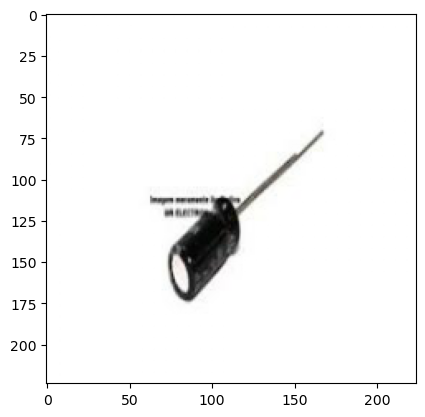

Predicted Label: Transistors
Actual Label: Capacitors


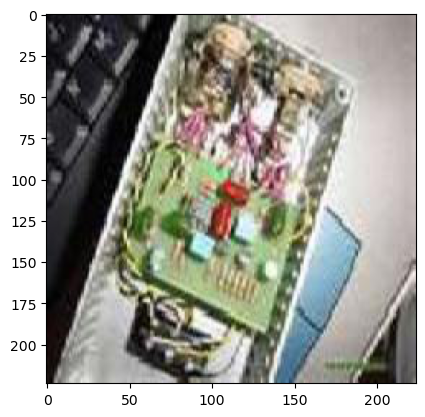

Predicted Label: Transistors
Actual Label: Capacitors


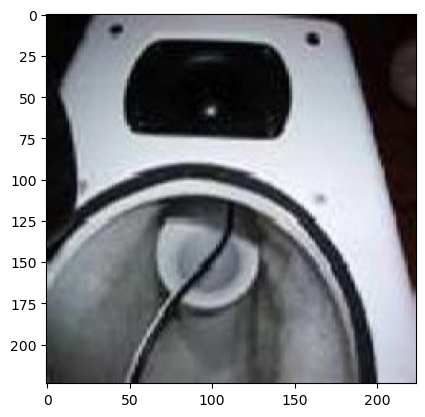

Predicted Label: Transistors
Actual Label: Resistor


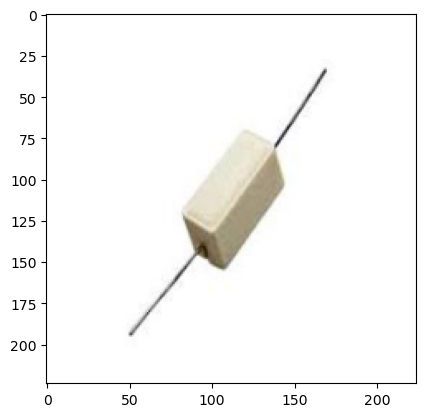

Predicted Label: Transistors
Actual Label: Capacitors


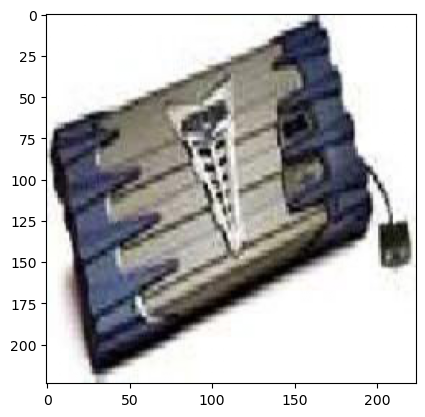

Predicted Label: Transistors
Actual Label: Resistor


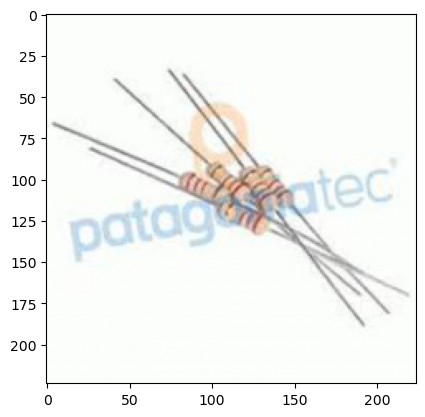

Predicted Label: Transistors
Actual Label: Capacitors


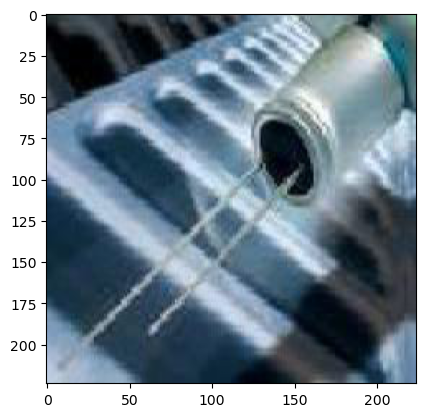

Predicted Label: Transistors
Actual Label: Capacitors


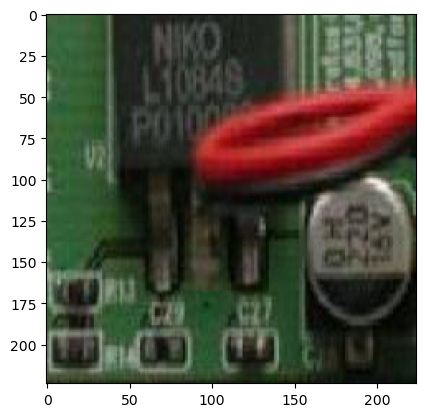

Predicted Label: Transistors
Actual Label: Capacitors


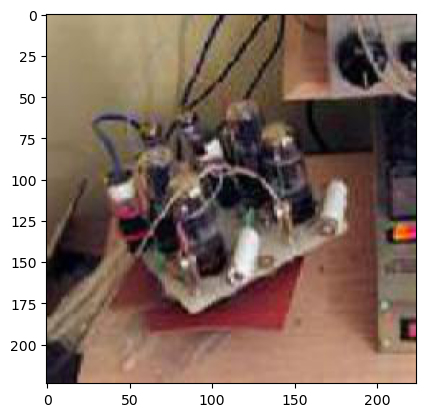

Predicted Label: Capacitors
Actual Label: Transistors


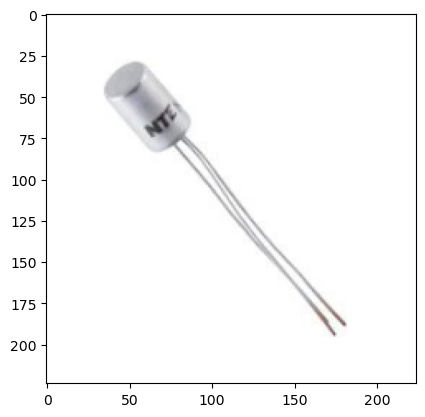

Predicted Label: Transistors
Actual Label: Capacitors


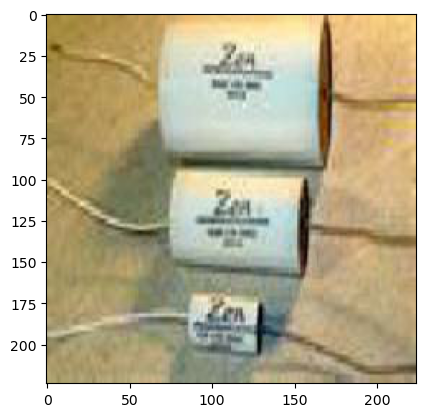

Predicted Label: Capacitors
Actual Label: Resistor


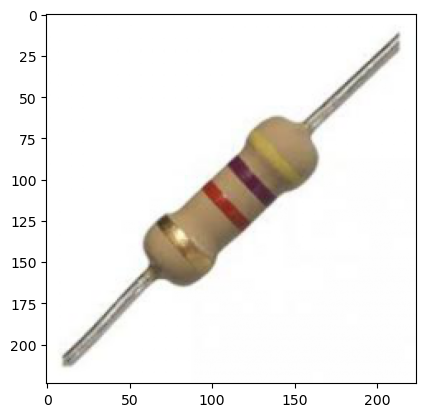

Predicted Label: Capacitors
Actual Label: Transistors


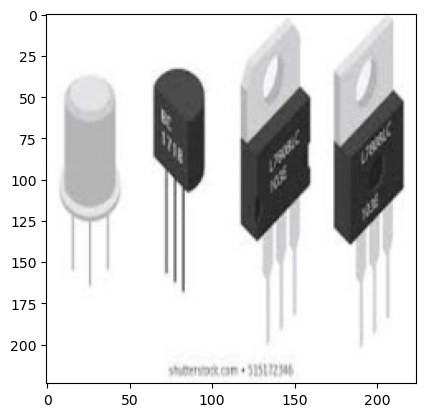

Predicted Label: Transistors
Actual Label: Capacitors


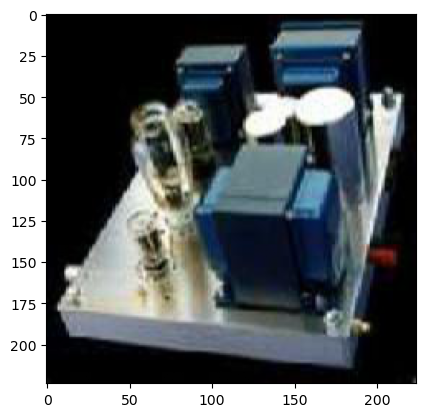

Predicted Label: Transistors
Actual Label: Capacitors


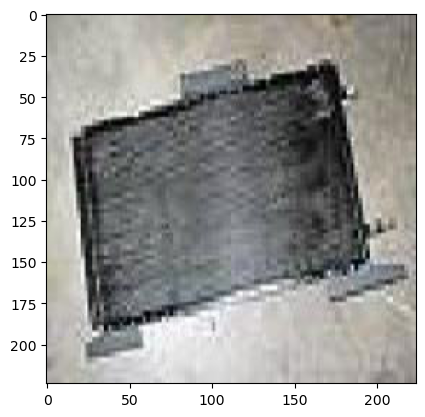

Predicted Label: Transistors
Actual Label: Capacitors


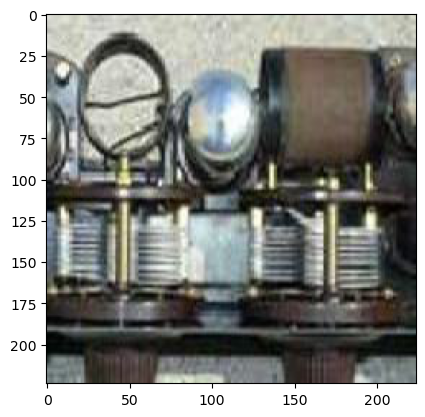

Predicted Label: Transistors
Actual Label: Capacitors


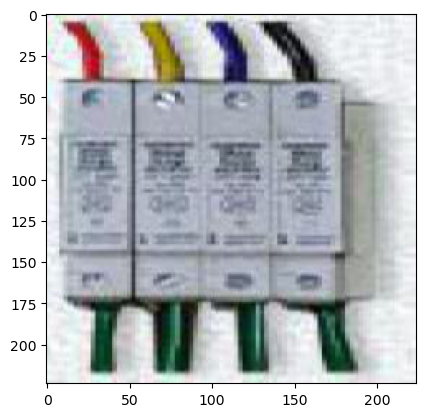

Predicted Label: Capacitors
Actual Label: Transistors


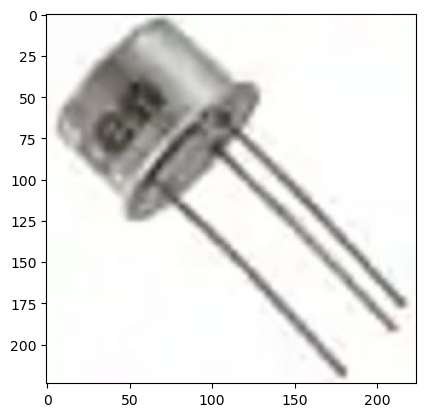

Predicted Label: Transistors
Actual Label: Capacitors


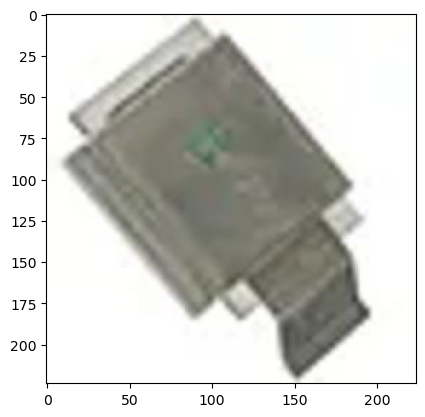

Predicted Label: Transistors
Actual Label: Capacitors


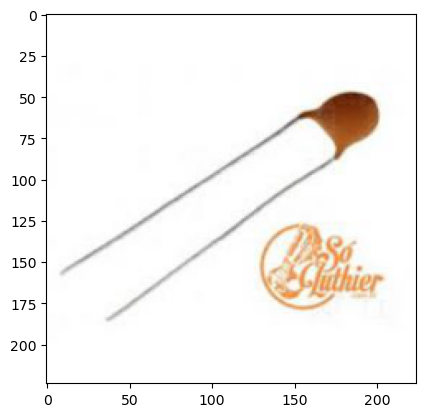

Predicted Label: Transistors
Actual Label: Capacitors


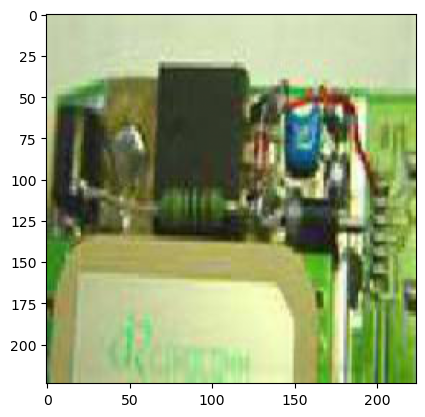

Predicted Label: Capacitors
Actual Label: Transistors


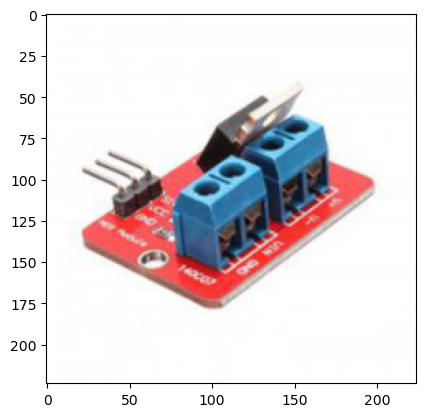

Predicted Label: Transistors
Actual Label: Capacitors


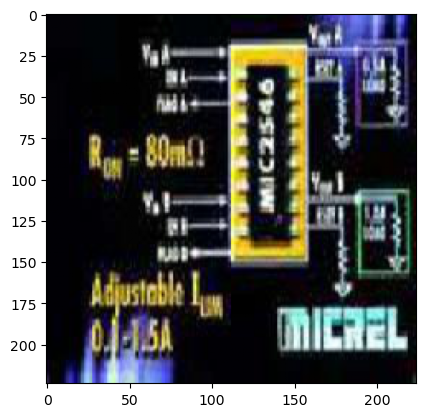

Predicted Label: Transistors
Actual Label: Capacitors


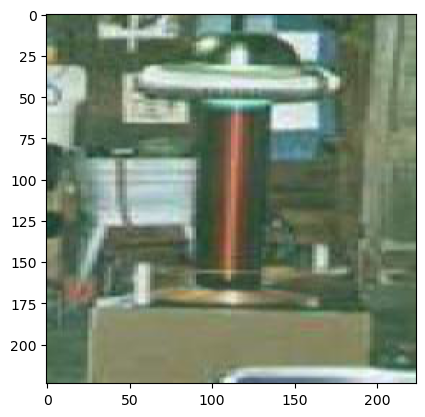

Predicted Label: Transistors
Actual Label: Capacitors


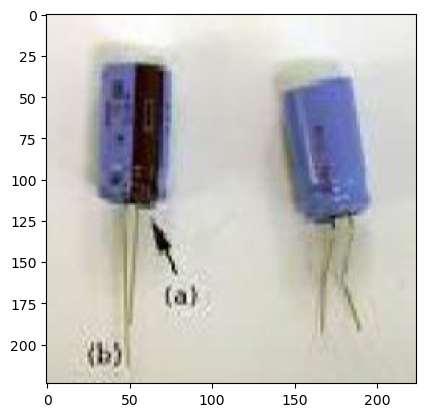

Predicted Label: Capacitors
Actual Label: Transistors


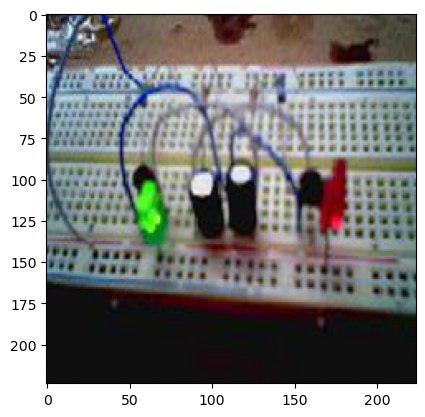

Predicted Label: Transistors
Actual Label: Capacitors


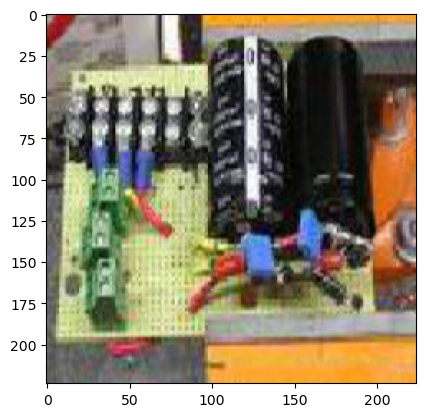

Predicted Label: Transistors
Actual Label: Capacitors


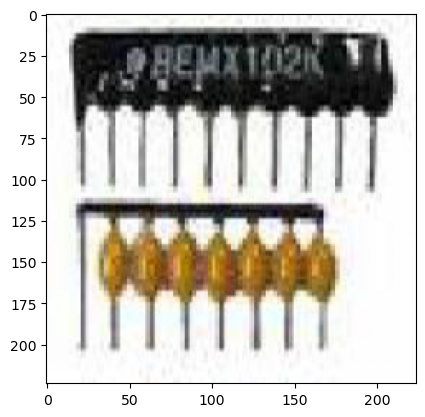

Predicted Label: Transistors
Actual Label: Capacitors


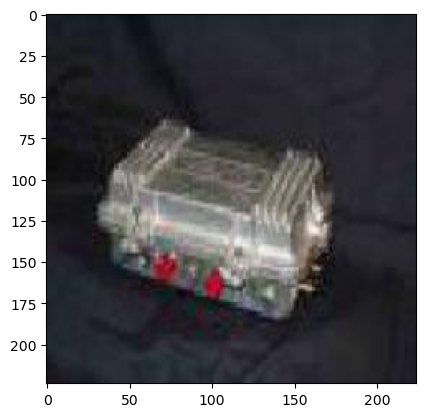

Predicted Label: Capacitors
Actual Label: Transistors


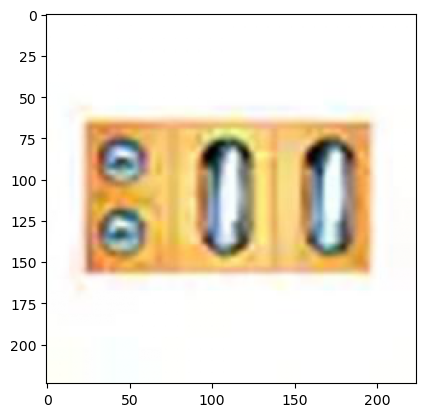

Predicted Label: Transistors
Actual Label: Capacitors


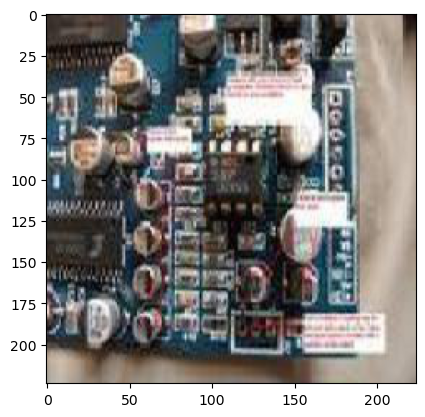

Predicted Label: Transistors
Actual Label: Capacitors


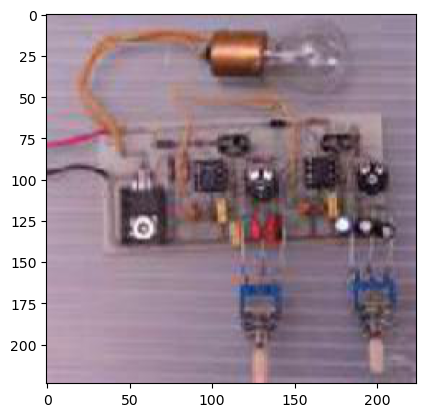

Predicted Label: Transistors
Actual Label: Capacitors


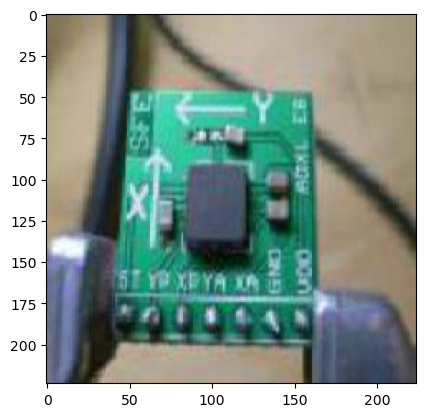

Predicted Label: Transistors
Actual Label: Capacitors


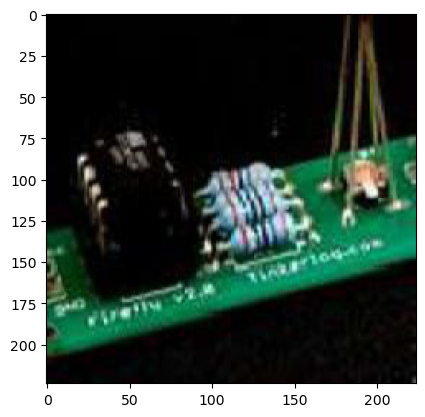

In [67]:
for i in range(len(wrong_predictions)):
    show_mismatched_image(i)
    plt.show()

28/28 [==============================] - 7s 235ms/step


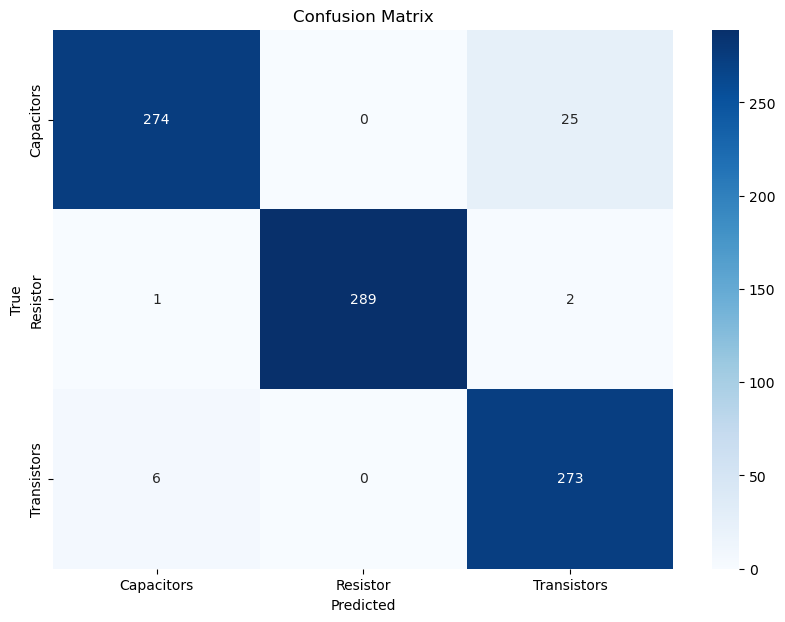

In [14]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_5.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

5/5 [==============================] - 1s 204ms/step


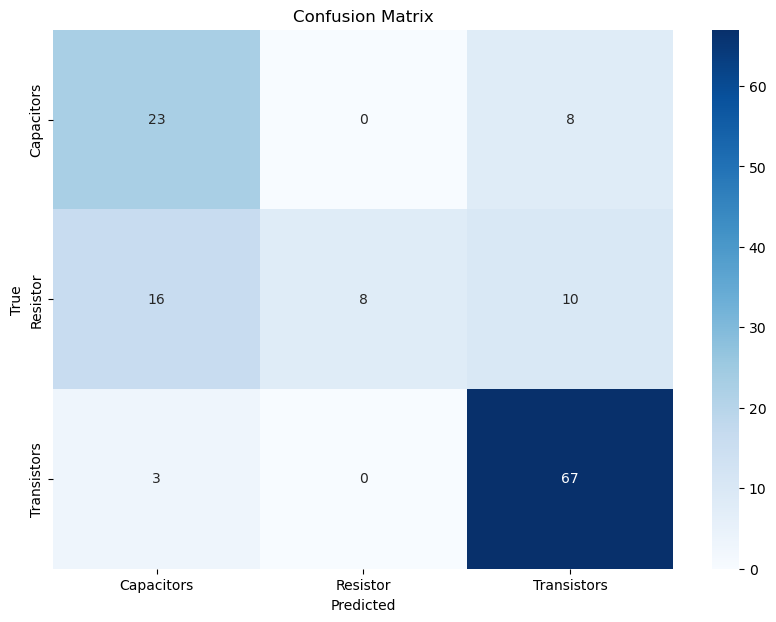

In [15]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_5.predict(X_validation)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_validation, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### Error analysis on holdout set

In [72]:
predictions = model_5.predict(X_validation)

predicted_labels = np.argmax(predictions, axis=1)
actual_labels = y_validation  # No need to apply np.argmax to y_test

mismatches = np.where(predicted_labels != actual_labels)[0]

wrong_predictions = X_validation[mismatches]

5/5 [==============================] - 1s 213ms/step


Predicted Label: Transistors
Actual Label: Resistor


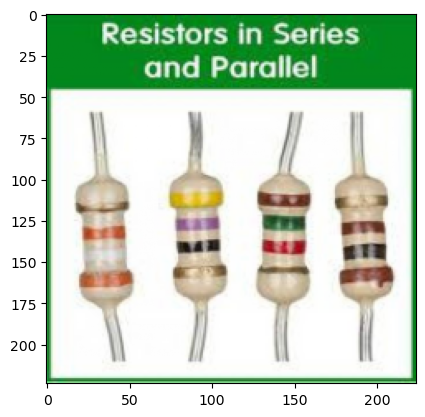

Predicted Label: Transistors
Actual Label: Resistor


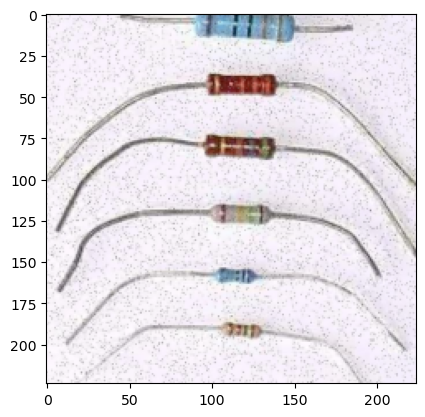

Predicted Label: Transistors
Actual Label: Resistor


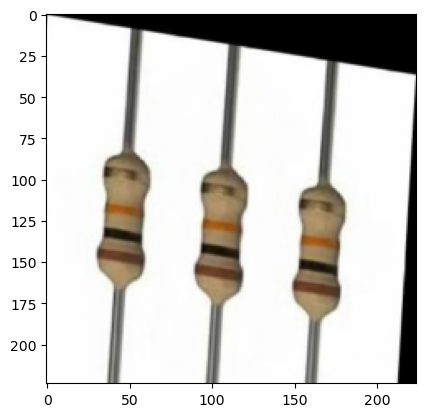

Predicted Label: Transistors
Actual Label: Resistor


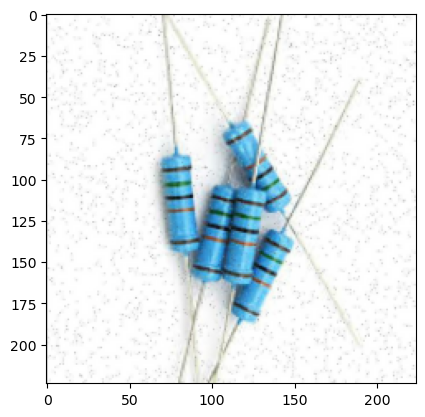

Predicted Label: Transistors
Actual Label: Capacitors


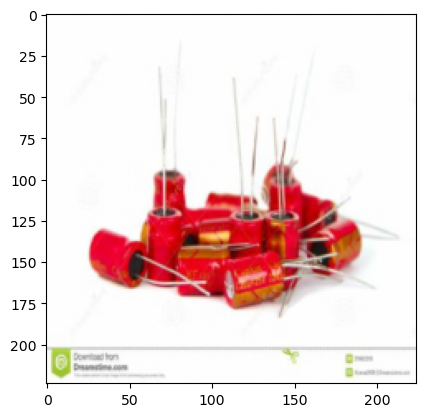

Predicted Label: Capacitors
Actual Label: Resistor


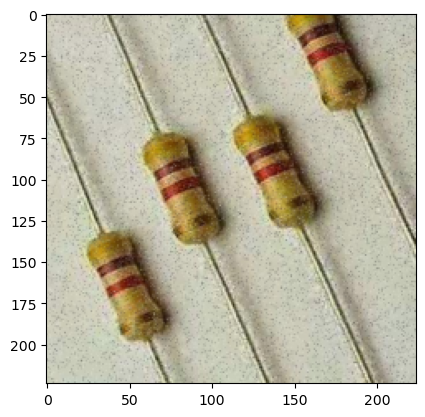

Predicted Label: Capacitors
Actual Label: Resistor


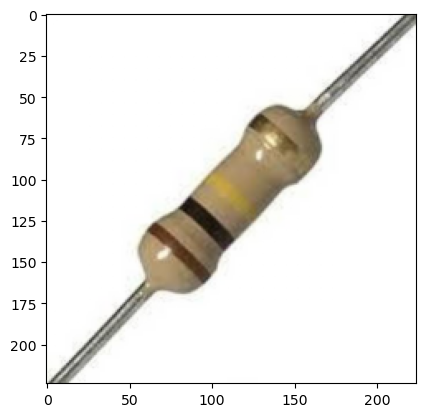

Predicted Label: Transistors
Actual Label: Capacitors


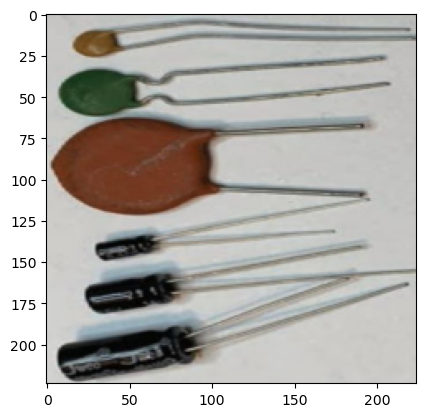

Predicted Label: Capacitors
Actual Label: Resistor


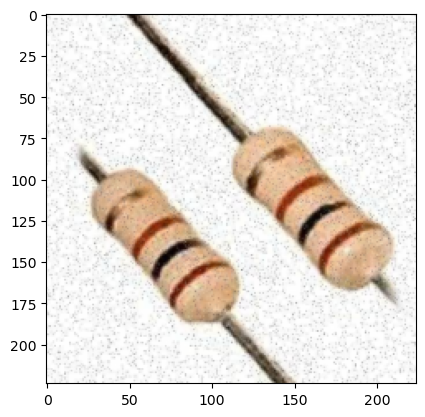

Predicted Label: Capacitors
Actual Label: Resistor


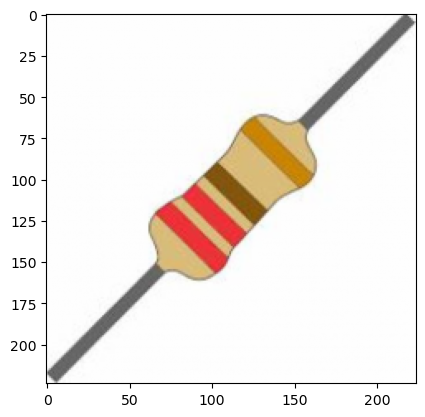

Predicted Label: Capacitors
Actual Label: Transistors


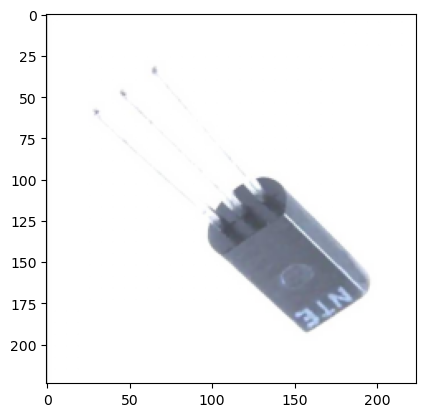

Predicted Label: Transistors
Actual Label: Capacitors


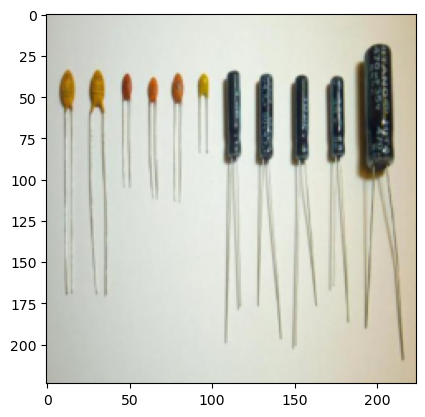

Predicted Label: Capacitors
Actual Label: Resistor


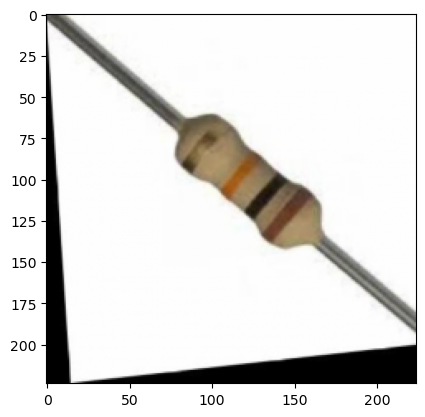

Predicted Label: Transistors
Actual Label: Capacitors


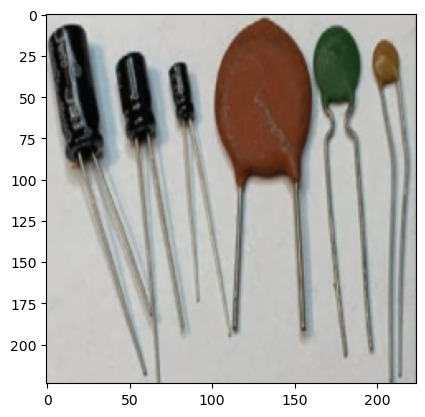

Predicted Label: Capacitors
Actual Label: Resistor


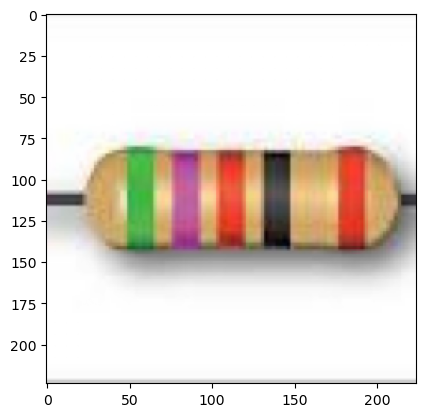

Predicted Label: Transistors
Actual Label: Resistor


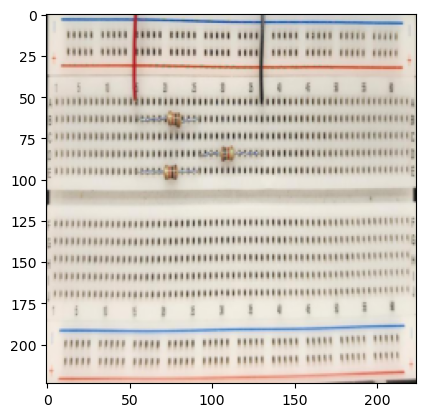

Predicted Label: Transistors
Actual Label: Resistor


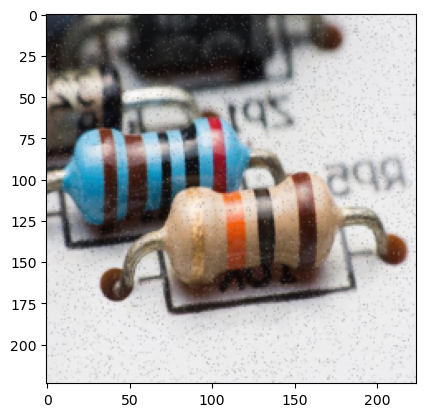

Predicted Label: Transistors
Actual Label: Capacitors


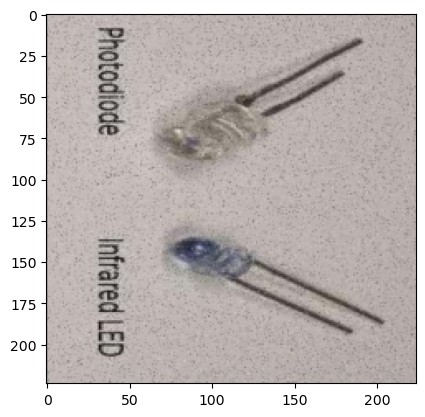

Predicted Label: Capacitors
Actual Label: Transistors


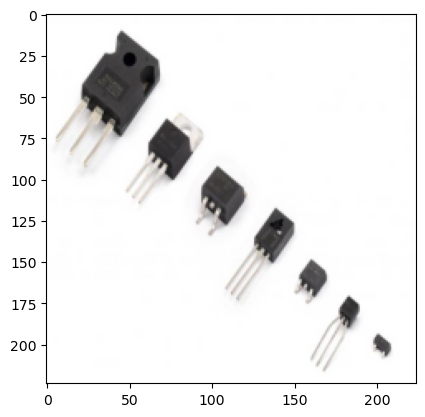

Predicted Label: Capacitors
Actual Label: Resistor


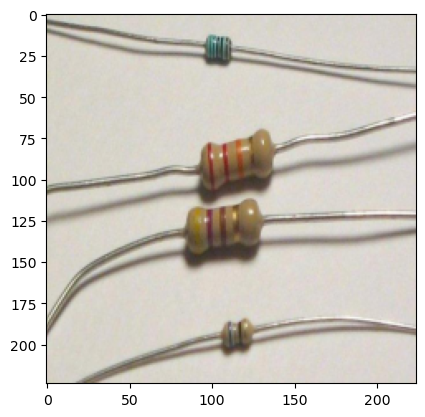

Predicted Label: Capacitors
Actual Label: Resistor


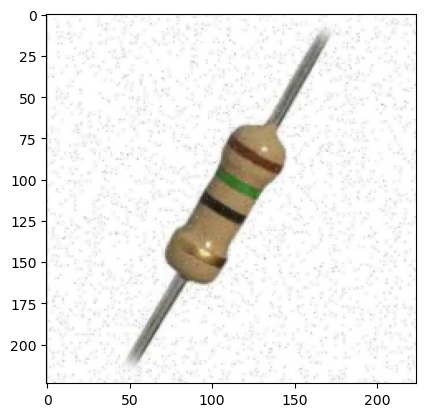

Predicted Label: Capacitors
Actual Label: Transistors


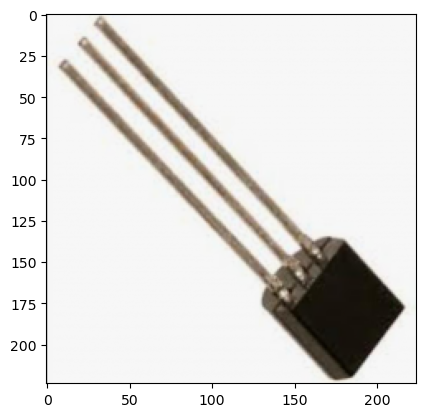

Predicted Label: Capacitors
Actual Label: Resistor


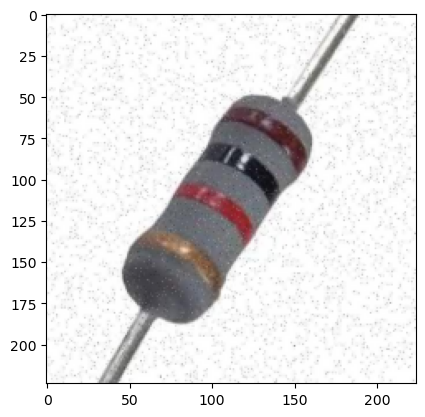

Predicted Label: Capacitors
Actual Label: Resistor


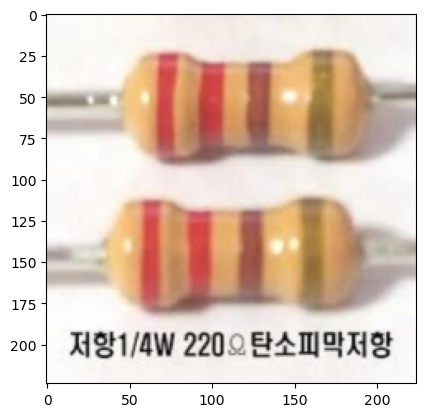

Predicted Label: Transistors
Actual Label: Resistor


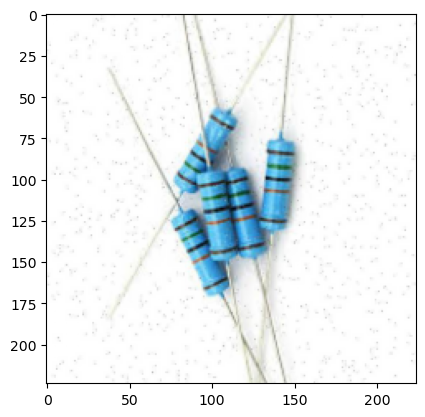

Predicted Label: Transistors
Actual Label: Resistor


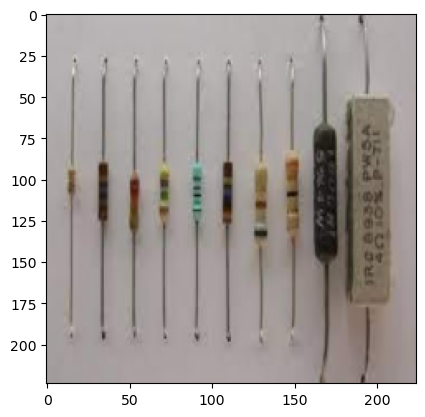

Predicted Label: Transistors
Actual Label: Resistor


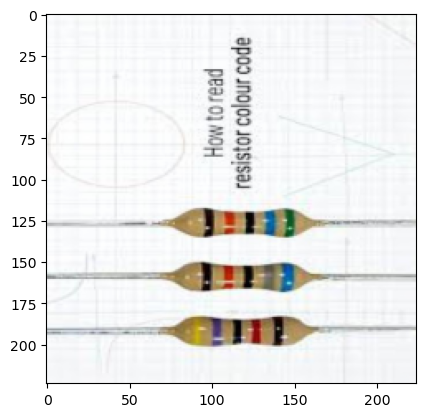

Predicted Label: Capacitors
Actual Label: Resistor


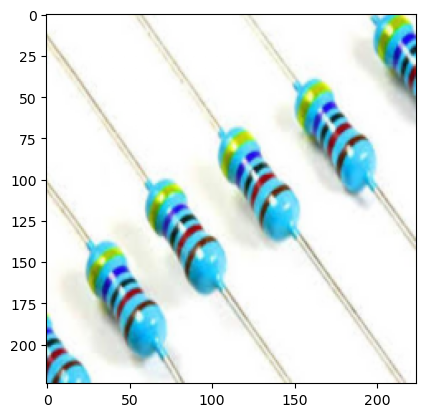

Predicted Label: Capacitors
Actual Label: Resistor


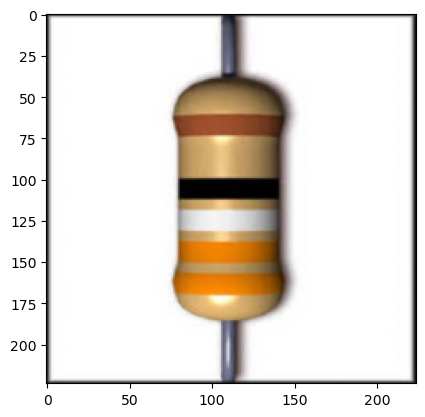

Predicted Label: Capacitors
Actual Label: Resistor


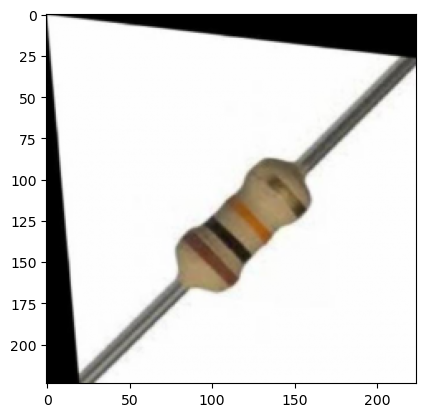

Predicted Label: Capacitors
Actual Label: Resistor


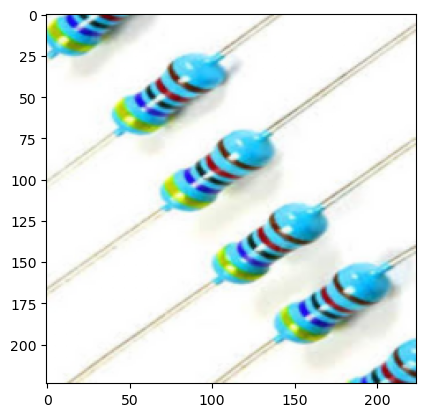

Predicted Label: Capacitors
Actual Label: Resistor


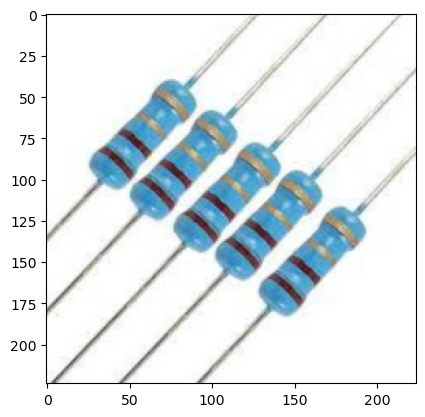

Predicted Label: Capacitors
Actual Label: Resistor


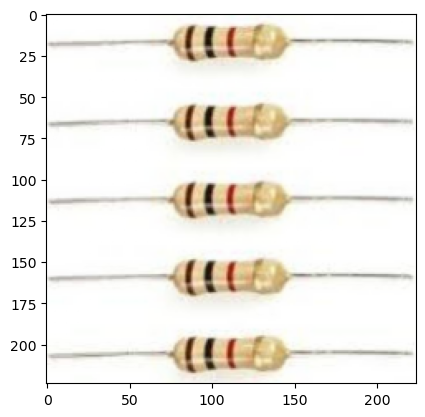

Predicted Label: Transistors
Actual Label: Resistor


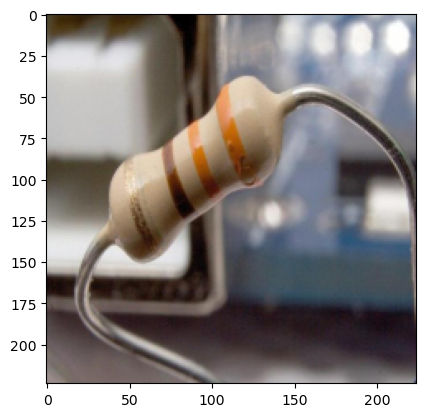

Predicted Label: Transistors
Actual Label: Capacitors


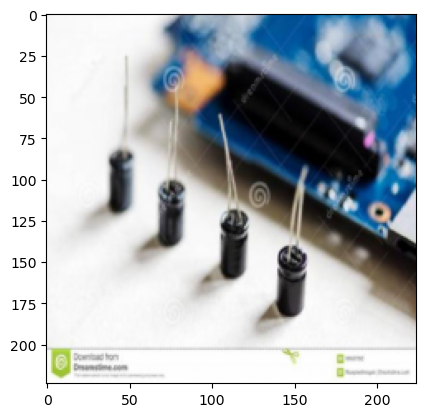

Predicted Label: Transistors
Actual Label: Capacitors


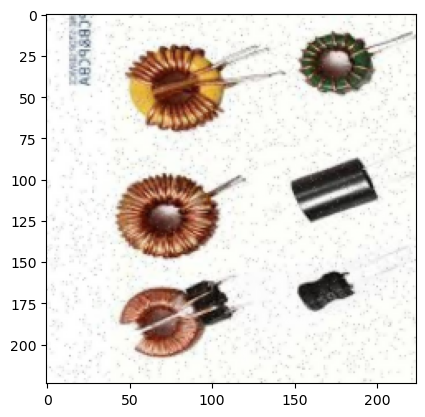

Predicted Label: Transistors
Actual Label: Capacitors


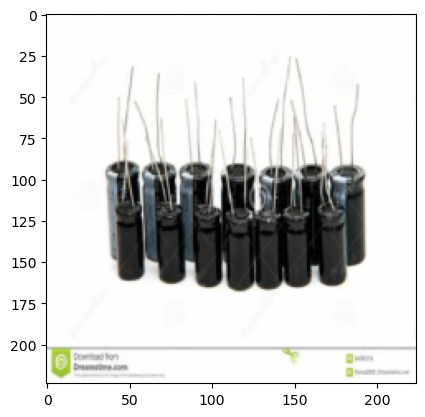

In [73]:
for i in range(len(wrong_predictions)):
    show_mismatched_image(i)
    plt.show()

### B: Identify Error Types

#### Misclassified Images from **X_test**

- **Total Misclassifications**: 37 images.
- **Observations**:
  - **Low Resolution**: Some images seem to have poor quality, making it harder for the model to classify them correctly.
  - **Contextual Misunderstandings**: Some images are cluttered or taken from a far distance, mixing up the scale and context of the objects.
  - **Scale Variations**: The model struggles with scale differences, especially when objects appear smaller or larger in the images.
  - **Inter-Class Similarity**: Transistors and Capacitors share similar physical characteristics (e.g., black tops with "legs"), causing confusion between the two.
  - **Mislabeling**: Some images appear to be incorrectly labeled (e.g., a Capacitor incorrectly labeled as a Transistor).
  - **Intra-Class Variability**: This is observed within Capacitors, where different types or sizes lead to misclassifications.

#### Performance on the **Hold-out Set**

- **Resistor Misclassification**: 
  - **Observation**: The Resistor class is the most misclassified in the hold-out set, which was not an issue during training.
  - **Cause**: The reason for this discrepancy is unclear at this point.
  
- **Transistor and Capacitor Misclassification**:
  - **Inter-Class Similarity**: Similar issues between Transistors and Capacitors, as noted in the test set. 
  - **Intra-Class Variability**: Some Capacitors show high variability, making them harder to classify accurately.
  - **Lighting and Exposure**: Some images of Capacitors have poor contrast, where the "legs" are not visible due to lighting and exposure issues, contributing to misclassifications.

#### Conclusion
- The misclassification of Resistors in the hold-out set requires further investigation, as it was not an issue during training.
- There is a clear need for better handling of scale variations, intra-class variability, and lighting/exposure issues.


### C: Categorize Errors

#### Misclassifications in **X_test**:

- **Contextual Misunderstandings**: 21.15% of total errors
- **Image Quality and Noise**: 17.31% of total errors
- **Occlusion**: 1.92% of total errors
- **Scale Variations**: 11.54% of total errors
- **Pose and Orientation Variability**: 7.69% of total errors
- **Inter-Class Similarity**: 7.69% of total errors
- **Intra-Class Variability**: 26.92% of total errors
- **Wrong Class**: 5.77% of total errors

#### Misclassifications in **Holdout**:

- **Intra-Class Variability**: 11.63% of total errors
- **Inter-Class Similarity**: 23.26% of total errors
- **Lighting and Exposure Issues**: 2.33% of total errors
- **Resistors Feature Drift**: 58.14% of total errors
- **Scale Variations**: 2.33% of total errors
- **Pose and Orientation Variability**: 2.33% of total errors


In [78]:
# Error categories and their counts
x_test_error_counts = {
    "Contextual Misunderstandings": 11,
    "Image Quality and Noise": 9,
    "Occlusion": 1,
    "Scale Variations": 6,
    "Pose and Orientation Variability": 4,
    "Inter-Class Similarity": 4,
    "Intra-Class Variability": 14,
    "Wrong Class": 3
}

total_errors = sum(x_test_error_counts.values())

error_percentages = {error: (count / total_errors) * 100 for error, count in x_test_error_counts.items()}

for error, percentage in error_percentages.items():
    print(f"{error}: {percentage:.2f}% of total errors")


Contextual Misunderstandings: 21.15% of total errors
Image Quality and Noise: 17.31% of total errors
Occlusion: 1.92% of total errors
Scale Variations: 11.54% of total errors
Pose and Orientation Variability: 7.69% of total errors
Inter-Class Similarity: 7.69% of total errors
Intra-Class Variability: 26.92% of total errors
Wrong Class: 5.77% of total errors


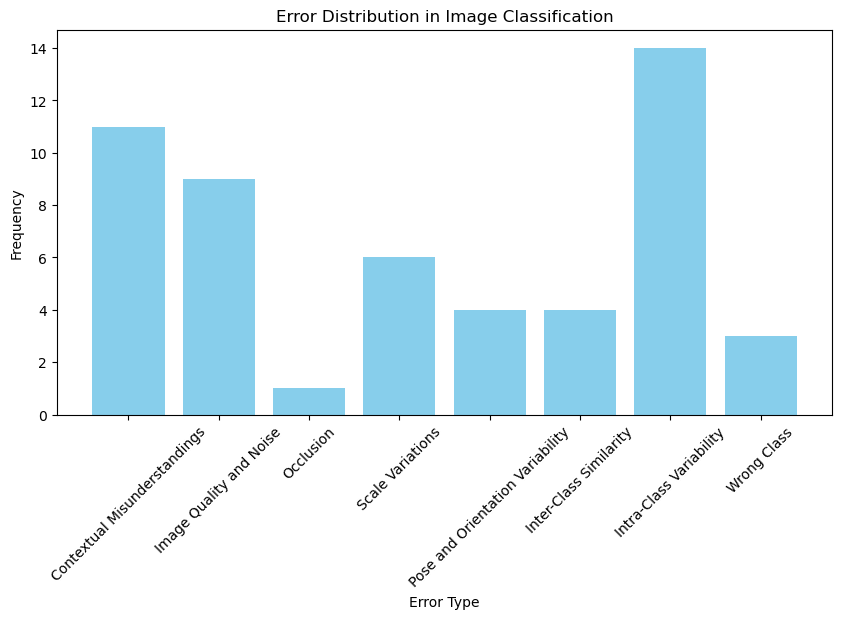

In [79]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.bar(x_test_error_counts.keys(), x_test_error_counts.values(), color='skyblue')
plt.xlabel("Error Type")
plt.ylabel("Frequency")
plt.title("Error Distribution in Image Classification")
plt.xticks(rotation=45)
plt.show()


In [80]:
X_validation_error_counts = {
    "Intra-Class Variability": 5,
    "Inter-Class Similarity": 10,
    "Lightning and Exposure Issues": 1,
    "Resistors feature drift": 25,
    "Scale Variations": 1,
    "Pose and Orientation Variability": 1
}

total_errors = sum(X_validation_error_counts.values())

error_percentages = {error: (count / total_errors) * 100 for error, count in X_validation_error_counts.items()}

for error, percentage in error_percentages.items():
    print(f"{error}: {percentage:.2f}% of total errors")

Intra-Class Variability: 11.63% of total errors
Inter-Class Similarity: 23.26% of total errors
Lightning and Exposure Issues: 2.33% of total errors
Resistors feature drift: 58.14% of total errors
Scale Variations: 2.33% of total errors
Pose and Orientation Variability: 2.33% of total errors


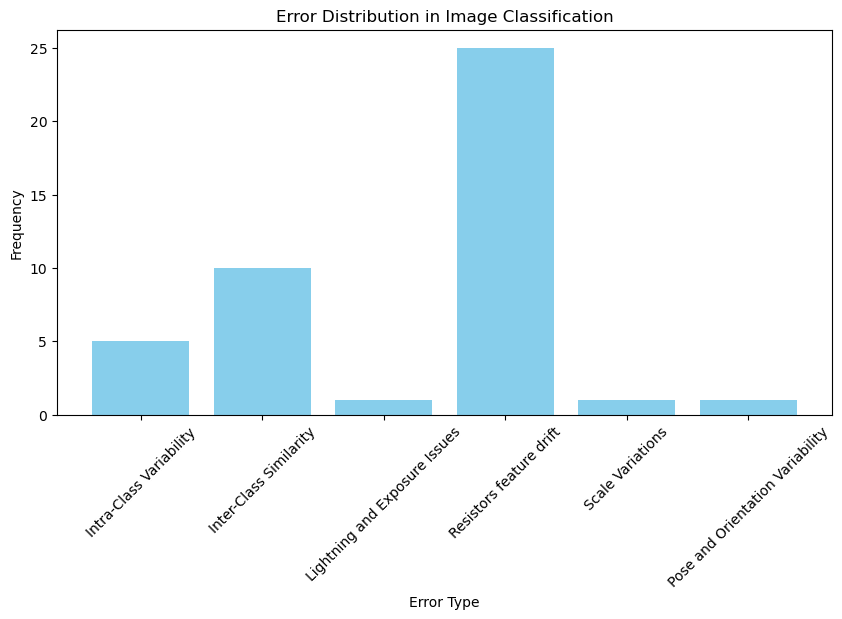

In [81]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.bar(X_validation_error_counts.keys(), X_validation_error_counts.values(), color='skyblue')
plt.xlabel("Error Type")
plt.ylabel("Frequency")
plt.title("Error Distribution in Image Classification")
plt.xticks(rotation=45)
plt.show()


### D: Propose Improvements

#### Hypotheses

**Intra-Class Variability (X_test):**  
Certain classes, particularly capacitors, exhibit many variations in color, shape, and size, making them harder to classify accurately.

**Resistors Feature Drift (Holdout):**  
The model likely did not encounter enough diverse resistor images during training, resulting in poor generalization to unseen resistor images in the holdout set.

**Inter-Class Similarity (Holdout):**  
Transistors and capacitors share similar features, such as a black top with long legs, leading the model to confuse them, especially when fine details are not clear.

**Contextual Misunderstanding (X_test):**  
Images containing multiple objects or cluttered backgrounds may confuse the model, especially if the components are small and not isolated.

**Image Quality and Noise (X_test):**  
Blurry, low-resolution, or noisy images may hinder the model’s ability to extract meaningful features, resulting in misclassifications.

**Scale Variations (Both):**  
The model struggles when the components appear at different sizes or distances, possibly due to a lack of scale invariance in the training data.

**Pose & Orientation Variability (Both):**  
The model may not have learned to handle variations in the pose or orientation of the components, such as rotations or flips.

#### Proposed Improvements

- **Data Augmentation**:  
  Introduce additional variability by augmenting the training data, particularly for classes with high intra-class variability. This could include random rotations, scaling, flipping, and color variations to help the model generalize better across different poses, orientations, and conditions.

- **Increase Resistor Samples**:  
  Add more diverse resistor images to the training set to improve the model's ability to generalize better to resistor variations, addressing the feature drift issue in the holdout set.

- **Fine-Grained Classification or Feature Extraction**:  
  Use fine-grained classification models or implement custom feature extraction techniques to handle inter-class similarity, especially between transistors and capacitors. This can help the model distinguish between similar classes by focusing on more subtle features.

- **Background Removal or Object Cropping**:  
  Use image cropping tools or segmentation techniques to extract individual components from larger images with cluttered backgrounds. This would help the model focus on the relevant parts of the images and avoid contextual misunderstandings.

- **Improve Image Quality**:  
  Preprocess images to enhance quality by removing noise, improving resolution, or using image denoising techniques, so the model has clearer and more informative data for feature extraction.

- **Handling Scale and Pose Variations**:  
  Incorporate more examples with different scales, poses, and orientations during training to ensure the model learns invariance to these factors. Alternatively, using a more robust model architecture or incorporating feature pyramids may help in dealing with scale variations.



# Iteration 7 (applying proposed improvements)

In this iteration, I made the following improvements:
- **Data Augmentation**: Introduced data augmentation to add more variability to the dataset.
- **Resistor and Transistor Samples**: Added more images of resistors and transistors to improve model generalization.
- **ResNet vs MobileNet**: I initially considered using ResNet for better feature extraction, but due to its complexity, training would take too long for this project. One epoch took over 7 minutes, while with MobileNet, it took less than 2 minutes. If I had access to a GPU, I might have considered ResNet.
- **Cropping Tools**: I did not use any tools to crop objects from larger images, as it was not feasible within the project scope.

Despite not using ResNet or cropping tools, the addition of data augmentation and more resistor images helped improve the model’s accuracy, and I am satisfied with the results.

In [4]:
import os
import numpy as np
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Desktop\Dataset_2\Capacitors",
    r"C:\Users\filip\Desktop\Dataset_2\Resistors",
    r"C:\Users\filip\Desktop\Dataset_2\Transistors"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitor", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (224, 224)

# Arrays to store the images (X) and class labels (y)
X = []
y = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                if len(class_images) == 3020:
                    break
    # Add the sampled images and their labels to the main arrays
    X.extend(class_images)
    y.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X, y = shuffle(X, y, random_state=42)

# Convert arrays into numpy arrays
X = np.array(X)
y = np.array(y)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

print("Encoded labels:", np.unique(y))  # Should be numbers like [0,1,2]


X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 2/10,
                                                    random_state = 42)
                                                    
print(X_train.shape, X_test.shape)

Encoded labels: [0 1 2]
(7248, 224, 224, 3) (1812, 224, 224, 3)


In [15]:
import os
import numpy as np
import skimage as ski
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Folder paths where the images of each class are stored
folder_paths = [
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Capacitor",
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Resistor",
    r"C:\Users\filip\Downloads\electronic object detection.v1i.yolokeras (1)\Sorted\Transistor"
]

# Class labels for the images (same order as folder_paths)
class_names = [
    "Capacitors", 
    "Resistor",
    "Transistors"
]

# Target size to resize the images
target_size = (224, 224)

# Arrays to store the images (X) and class labels (y)
X_validation = []
y_validation = []

for i in range(len(folder_paths)):
    class_images = []
    for filename in os.listdir(folder_paths[i]):
        file_extension = os.path.splitext(filename)[1]
        # Check if the file extension is an image extension 
        if file_extension == ".jpg" or file_extension == ".jpeg" or file_extension == ".png": 
            image_filename = os.path.join(folder_paths[i], filename)
            # Read the image file using scikit-image
            image = ski.io.imread(image_filename)
            # Check if the image is a 3D array
            if image.ndim == 3:
                # Resize the image to the target_size
                image_resized = ski.transform.resize(image, target_size)
                # Insert the image into class_images
                class_images.append(image_resized)
                # Stop if we have enough images for this class
                #if len(class_images) == 30:
                #    break
    # Add the sampled images and their labels to the main arrays
    X_validation.extend(class_images)
    y_validation.extend([class_names[i]] * len(class_images))

# Shuffle the dataset
X_validation, y_validation = shuffle(X_validation, y_validation, random_state=42)

# Convert arrays into numpy arrays
X_validation = np.array(X_validation)
y_validation = np.array(y_validation)



# Convert class names to numbers (0,1,2)
label_encoder = LabelEncoder()
y_validation = label_encoder.fit_transform(y_validation)

print("Encoded labels:", np.unique(y_validation))  # Should be numbers like [0,1,2]
X_validation.shape

Encoded labels: [0 1 2]


(134, 224, 224, 3)

In [6]:
# Add your code to create a CNN architecture for your image dataset.
from tensorflow import keras

mobilenet = keras.applications.MobileNet(
                include_top=False,
                weights='imagenet',
                input_shape=(224, 224, 3))

mobilenet.trainable = False

In [7]:
model_7 = keras.Sequential([
    keras.layers.Input(shape=(224, 224, 3)),
    keras.layers.RandomRotation(0.2),
    keras.layers.RandomFlip(),
    keras.layers.BatchNormalization(),
    mobilenet,
    keras.layers.Conv2D(48, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=1),
    keras.layers.Conv2D(96, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=2),
    keras.layers.Conv2D(96, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D((2, 2), strides=2),
    keras.layers.Conv2D(182, (3, 3), strides=1, padding='same', activation='relu'),
    keras.layers.Conv2D(182, (3, 3), strides=2, padding='same', activation='relu'),
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dense(3, activation='softmax')
])

model_7.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_rotation_1 (RandomR  (None, 224, 224, 3)       0         
 otation)                                                        
                                                                 
 random_flip_1 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 batch_normalization (Batch  (None, 224, 224, 3)       12        
 Normalization)                                                  
                                                                 
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 conv2d (Conv2D)             (None, 7, 7, 48)          442416    
                                                        

In [8]:
model_7.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_7.fit(X_train, y_train, epochs=40, batch_size=32, validation_split=0.20, callbacks=[keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True), keras.callbacks.History()])


Epoch 1/40


182/182 [==============================] - 163s 878ms/step - loss: 0.2627 - accuracy: 0.8982 - val_loss: 0.1598 - val_accuracy: 0.9455
Epoch 2/40
182/182 [==============================] - 155s 850ms/step - loss: 0.1560 - accuracy: 0.9458 - val_loss: 0.1777 - val_accuracy: 0.9331
Epoch 3/40
182/182 [==============================] - 152s 833ms/step - loss: 0.1373 - accuracy: 0.9486 - val_loss: 0.1019 - val_accuracy: 0.9586
Epoch 4/40
182/182 [==============================] - 152s 833ms/step - loss: 0.1320 - accuracy: 0.9522 - val_loss: 0.1009 - val_accuracy: 0.9586
Epoch 5/40
182/182 [==============================] - 150s 826ms/step - loss: 0.1092 - accuracy: 0.9595 - val_loss: 0.1081 - val_accuracy: 0.9593
Epoch 6/40
182/182 [==============================] - 160s 881ms/step - loss: 0.1000 - accuracy: 0.9629 - val_loss: 0.0972 - val_accuracy: 0.9621
Epoch 7/40
182/182 [==============================] - 154s 846ms/step - loss: 0.0895 - accuracy: 0.9690 - val_loss: 0.114

### Evaluation

Despite a small drop in accuracy, the improvement on the holdout set is over 90%. With these final results, I am satisfied and ready to move on to the next phase of the project.

In [11]:
model_7.evaluate(X_test, y_test)

57/57 [==============================] - 14s 252ms/step - loss: 0.1096 - accuracy: 0.9564


[0.10964200645685196, 0.9564017653465271]

In [17]:
model_7.evaluate(X_validation, y_validation)

5/5 [==============================] - 1s 196ms/step - loss: 0.2386 - accuracy: 0.9179


[0.23859070241451263, 0.9179104566574097]

57/57 [==============================] - 15s 253ms/step


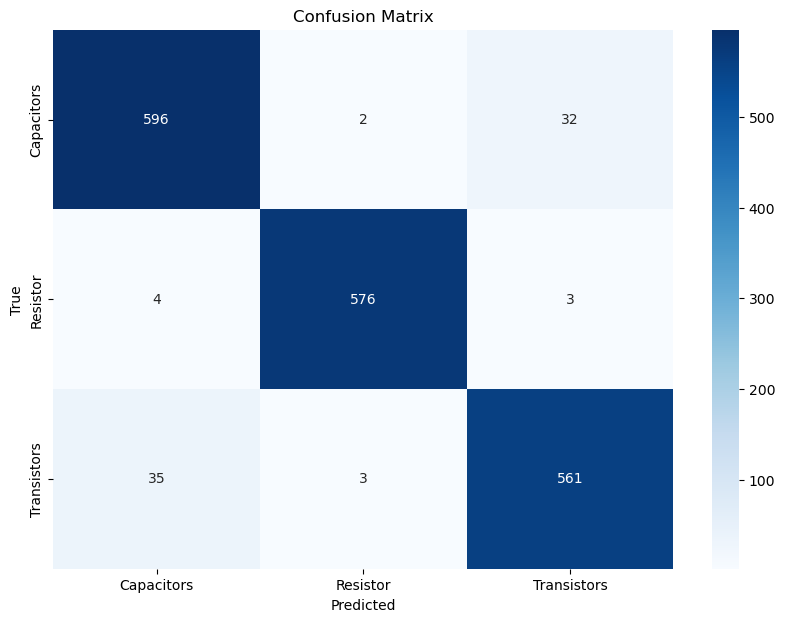

In [13]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_7.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

5/5 [==============================] - 1s 198ms/step


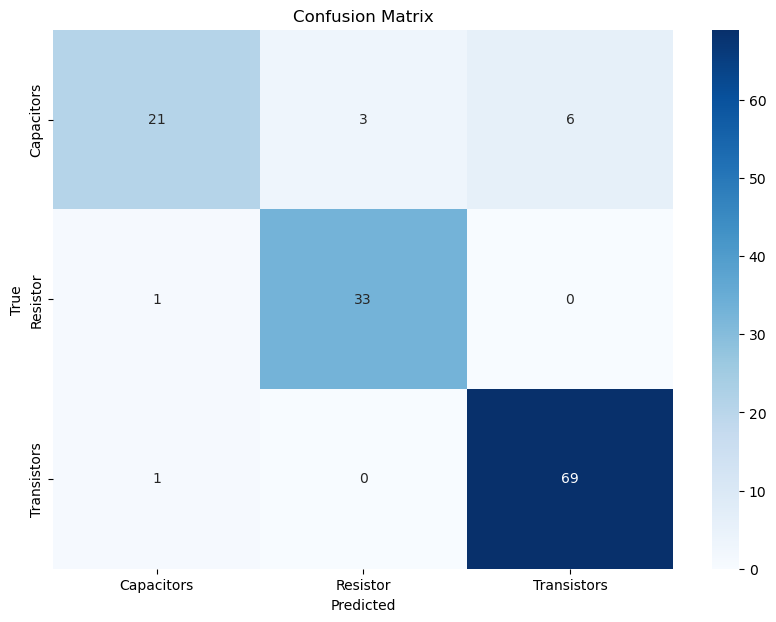

In [16]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Predict the labels for the test set
y_pred = model_7.predict(X_validation)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the confusion matrix
cm = confusion_matrix(y_validation, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### Exporting the model

In [18]:
model_7.save('best_model.h5')
model_7.save_weights('best_model_weights.h5')

c:\Users\filip\anaconda3\envs\block_c\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [21]:
test_model = keras.saving.load_model('best_model.h5')
test_model.load_weights('best_model_weights.h5')

In [22]:
test_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_rotation_1 (RandomR  (None, 224, 224, 3)       0         
 otation)                                                        
                                                                 
 random_flip_1 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 batch_normalization (Batch  (None, 224, 224, 3)       12        
 Normalization)                                                  
                                                                 
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 conv2d (Conv2D)             (None, 7, 7, 48)          442416    
                                                        

In [23]:
test_model.evaluate(X_validation, y_validation)

5/5 [==============================] - 1s 202ms/step - loss: 0.2386 - accuracy: 0.9179


[0.23859070241451263, 0.9179104566574097]